# The impact of government debt on economic growth
### This is an Investigation on the impact of Government debt on per-capita GDP. 
***More Specifically in this notebook***:
- **Import of WorldBank Data**
- **Data cleaning**
    - Replacing the missing values with the numpy module to na
    - Separating the dataset to one dataframe for each country
    - Finding out the variation (using the Standard Deviation) of the data for each country
    - Figuring out the missing values of the data 
- **Descriptive Statistics**
    - Summary of the central tendency, dispersion, and shape of the distribution for the data of each Country
    - Analysis of the evolution of the Indicators through time of each country
    - Correlation Analysis between the indicators of each Country
    - Adding all the countries in a dataframe and analyzing the GDP Growth and the debt in debth 
    - Analyzing the rest Indicators
- **Econometric Analysis**
    - Correlation Analysis using Scatterplots
    - Regression analysis model for all the countries
    - Distinguishing the Countries to higher and lower Income
    - Regression Analysis model on lower Income Countries and on Higher Income Countries
    - Comparing the prediction of the model to the reality of GDP Growth
    

### There were selected 12 Countries. The methodology of selection was a combination of each Country's Currency Power and their General  Power on affecting the Trends. So the main Goal of this Investigation is to see at what Point the growth of those Countries is getting affected by the Debt.
#### *The Selection took place according to the following sites: 
#### *Most Powerful Countries: https://www.forbesindia.com/article/explainers/top-10-powerful-countries-in-the-world/87201/1
#### *Most Powerful Currencies: https://www.forbes.com/advisor/money-transfer/highest-currencies-in-the-world/

**The Countries that Participated in the Investigation are: China, Canada, France, Germany, Italy, Korea, Japan, Switzerland, Russian Federation, United Arab Emirates, United Kingdom and United States of America**
* *Italy was selected as a country that is in the Euro Area and as a member of the G8 (The Group of Advanced Economies)*
* *Canada was selected as a country in the Dollar Area as a member of the G8 and as part of America*

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from linearmodels.panel import PanelOLS
from linearmodels.panel import compare
from linearmodels import IVSystemGMM

In [2]:
os.chdir("Downloads")
df = pd.read_excel("worldbank_data.xlsx")

# Data Cleaning

In [3]:
df.head()

,Country Name,Country Code,Series Name,Series Code,2000 [YR2000],2001 [YR2001],2002 [YR2002],2003 [YR2003],2004 [YR2004],2005 [YR2005],...,2013 [YR2013],2014 [YR2014],2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021],2022 [YR2022]
0,China,CHN,Current account balance (% of GDP),BN.CAB.XOKA.GD.ZS,1.69387,1.299163,2.408746,2.593031,3.525766,5.790933,...,1.548554,2.253294,2.649011,1.7033,1.532645,0.173667,0.720659,1.694172,1.980228,2.237107
1,China,CHN,GDP per capita growth (annual %),NY.GDP.PCAP.KD.ZG,7.638598,7.551655,8.40488,9.354777,9.461559,10.741375,...,7.050734,6.75076,6.420736,6.238215,6.301863,6.251701,5.575317,1.995558,8.35073,3.004297
2,China,CHN,Gross savings (% of GDP),NY.GNS.ICTR.ZS,35.739554,37.269297,38.883221,42.413504,45.672367,45.954784,...,47.378392,47.615818,45.417589,44.380661,44.905048,44.485748,43.773028,43.926417,45.259789,..
3,China,CHN,Population growth (annual %),SP.POP.GROW,0.787957,0.726381,0.67,0.622861,0.593933,0.588125,...,0.666073,0.630326,0.581456,0.573051,0.605245,0.467672,0.354741,0.238041,0.089252,-0.0131
4,China,CHN,Real interest rate (%),FR.INR.RINR,3.710664,3.726664,4.679724,2.638147,-1.282812,1.613278,...,3.755387,4.522308,4.353072,2.901815,0.112554,0.821502,3.024385,3.838601,-0.194431,2.056524


#### The missing values from the world bank database are being shown as "..". In order to be able to use the dataset with the missing values I am changing the ".." values to n/a values with numpy. 

In [4]:
df.replace("..", np.nan, inplace=True)

#### Now looking for missing values in every sector 

In [5]:
df.isna().sum()

Country Name      0
Country Code      0
Series Name       0
Series Code      12
2000 [YR2000]    17
2001 [YR2001]    15
2002 [YR2002]    15
2003 [YR2003]    15
2004 [YR2004]    15
2005 [YR2005]    15
2006 [YR2006]    15
2007 [YR2007]     4
2008 [YR2008]     2
2009 [YR2009]     3
2010 [YR2010]     3
2011 [YR2011]     3
2012 [YR2012]     2
2013 [YR2013]     2
2014 [YR2014]     2
2015 [YR2015]     3
2016 [YR2016]     3
2017 [YR2017]     5
2018 [YR2018]     7
2019 [YR2019]     7
2020 [YR2020]     7
2021 [YR2021]    10
2022 [YR2022]    42
dtype: int64

In [6]:
# Dropping the columns that won't be needed in the analysis
df_country_codes = df["Country Code"]
df.drop(columns = ["Country Code", "Series Code", "2021 [YR2021]", "2022 [YR2022]" ], inplace = True)

In [7]:
# Making sure that all the countries have all the 10 variables
df.value_counts("Country Name")

Country Name
Canada                         10
France                         10
Germany                        10
Italy                          10
Japan                          10
Russian Federation             10
Switzerland                    10
United Arab Emirates           10
United Kingdom                 10
United States                  10
China                           9
Korea, Rep.                     9
China, People's Republic of     1
Korea, Republic of              1
dtype: int64

In [8]:
# Changing the names of Korea and China so they can be analyzed easier
df.loc[df['Country Name'] == "China, People's Republic of", 'Country Name'] = 'China'
df.loc[df['Country Name'] == "Korea, Republic of", 'Country Name'] = 'Korea, Rep.'
# Korea, Rep. can be named as Korea for my convenience
df.loc[df['Country Name'] == "Korea, Rep.", 'Country Name'] = 'Korea'

In [9]:
# Changing the dates format to make the typing of them easier and faster
for i in range (2000,2021):
    df.rename(columns={f'{i} [YR{i}]': f"{i}"}, inplace=True)

In [10]:
df.value_counts("Country Name")

Country Name
Canada                  10
China                   10
France                  10
Germany                 10
Italy                   10
Japan                   10
Korea                   10
Russian Federation      10
Switzerland             10
United Arab Emirates    10
United Kingdom          10
United States           10
dtype: int64

#### Making a dataset for every country for my explanatory analysis

In [11]:
# Country <-- df
Canada = df[df["Country Name"] == "Canada"]
Canada = Canada.drop(columns = ["Country Name"])
China = df[df["Country Name"] == "China"]
China = China.drop(columns = ["Country Name"])
France = df[df["Country Name"] == "France"]
France = France.drop(columns = ["Country Name"])
Germany = df[df["Country Name"] == "Germany"]
Germany = Germany.drop(columns = ["Country Name"])
Italy = df[df["Country Name"] == "Italy"]
Italy = Italy.drop(columns = ["Country Name"])
Japan = df[df["Country Name"] == "Japan"]
Japan = Japan.drop(columns = ["Country Name"])
Korea = df[df["Country Name"] == "Korea"]
Korea = Korea.drop(columns = ["Country Name"])
Russian_Federation = df[df["Country Name"] == "Russian Federation"]
Russian_Federation = Russian_Federation.drop(columns = ["Country Name"])
Switzerland = df[df["Country Name"] == "Switzerland"]
Switzerland = Switzerland.drop(columns = ["Country Name"])
Uae = df[df["Country Name"] == "United Arab Emirates"]
Uae = Uae.drop(columns = ["Country Name"])
Uk = df[df["Country Name"] == "United Kingdom"]
Uk = Uk.drop(columns = ["Country Name"])
Us = df[df["Country Name"] == "United States"]
Us = Us.drop(columns = ["Country Name"])

In [12]:
Canada

,Series Name,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
100,Current account balance (% of GDP),2.483228,2.132425,1.645030,1.164988,2.263151,1.869656,1.363656,0.752359,0.204634,...,-2.774006,-3.532248,-3.146875,-2.318921,-3.513987,-3.093111,-2.803427,-2.385115,-1.951703,-2.146960
101,GDP per capita growth (annual %),4.202683,0.690161,1.903852,0.888030,2.129631,2.234059,1.602575,1.085367,-0.083592,...,2.141536,0.662001,1.253614,1.841026,-0.089286,-0.135843,1.811279,1.335564,0.435426,-6.088212
102,Gross savings (% of GDP),23.774628,22.635490,21.724737,21.943777,23.660504,24.451754,24.617277,24.404320,24.247409,...,20.857109,20.917951,21.597298,22.148494,19.569364,19.146455,19.845281,19.582929,20.261634,18.941758
103,Population growth (annual %),0.931282,1.086351,1.087448,0.901373,0.933021,0.944467,1.010335,0.971135,1.082907,...,0.978698,1.085817,1.056591,1.005338,0.746339,1.132349,1.199521,1.412456,1.436137,1.073796
104,Real interest rate (%),2.813457,4.086106,2.932943,1.387663,0.710526,1.254600,3.157424,2.736106,0.713546,...,-0.228158,1.765411,1.240990,1.035269,3.684016,1.931407,0.131627,NaN,NaN,NaN
105,"Foreign direct investment, net inflows (% of GDP)",9.171024,3.842020,3.219148,0.782968,0.141466,2.178164,4.874101,8.200559,4.515137,...,2.137833,2.700169,3.629804,3.553903,3.853895,2.238350,1.537521,2.469357,2.806767,1.844172
106,"Foreign direct investment, net outflows (% of ...",6.263692,4.984265,3.843513,2.616225,4.365776,2.325413,3.816692,4.434938,5.710829,...,2.793397,3.404594,2.949459,3.598494,5.391157,4.424490,4.740764,3.637650,4.353194,2.804193
107,Gross fixed capital formation (% of GDP),19.599336,20.151765,19.974918,20.012401,20.874597,21.837429,22.885203,23.338996,23.469017,...,23.510495,24.494186,24.187212,24.389329,23.850582,22.772376,22.696333,22.676090,22.579977,23.520725
108,High-technology exports (% of manufactured exp...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.766290,15.180604,...,14.711298,15.615285,15.491842,14.665247,14.828048,14.098877,14.348356,15.421879,16.100181,15.333627
109,Debt,46.190434,46.009193,42.916778,40.477244,36.570387,36.144669,33.699830,29.826243,34.813019,...,44.226163,45.349910,41.578039,39.851060,42.458430,41.639320,39.255298,36.155300,35.723236,59.445550


#### The dataset is not easily understandable so I am changing the dataset by turning the rows into columns and the columns into rows

In [13]:
# Transposing country 
# Transpose the dataframe

# Canada
Canada = Canada.transpose()
Canada.columns = Canada.iloc[0]
Canada = Canada.drop(Canada.index[0])
# China
China = China.transpose()
China.columns = China.iloc[0]
China = China.drop(China.index[0])
# France
France = France.transpose()
France.columns = France.iloc[0]
France = France.drop(France.index[0])
# Germany
Germany = Germany.transpose()
Germany.columns = Germany.iloc[0]
Germany = Germany.drop(Germany.index[0])
# Italy
Italy = Italy.transpose()
Italy.columns = Italy.iloc[0]
Italy = Italy.drop(Italy.index[0])
# Japan
Japan = Japan.transpose()
Japan.columns = Japan.iloc[0]
Japan = Japan.drop(Japan.index[0])
# Korea
Korea = Korea.transpose()
Korea.columns = Korea.iloc[0]
Korea = Korea.drop(Korea.index[0])
# Russian_Federation
Russian_Federation = Russian_Federation.transpose()
Russian_Federation.columns = Russian_Federation.iloc[0]
Russian_Federation = Russian_Federation.drop(Russian_Federation.index[0])
# Switzerland
Switzerland = Switzerland.transpose()
Switzerland.columns = Switzerland.iloc[0]
Switzerland = Switzerland.drop(Switzerland.index[0])
# Uae
Uae = Uae.transpose()
Uae.columns = Uae.iloc[0]
Uae = Uae.drop(Uae.index[0])
# Uk
Uk = Uk.transpose()
Uk.columns = Uk.iloc[0]
Uk = Uk.drop(Uk.index[0])
# Us
Us = Us.transpose()
Us.columns = Us.iloc[0]
Us = Us.drop(Us.index[0])

In [14]:
Canada.index

Index(['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017',
       '2018', '2019', '2020'],
      dtype='object')

#### Collecting the values dispersion by looking at the standard deviation of each country for each sector so I can start having a taste of the dataset

In [15]:
# adding stds
df_std = pd.DataFrame()
df_std["Canada"] = Canada.std()
df_std["China"] = China.std()
df_std["France"] = France.std()
df_std["Germany"] = Germany.std()
df_std["Italy"] = Italy.std()
df_std["Japan"] = Japan.std()
df_std["Korea"] = Korea.std()
df_std["Russian Federation"] = Russian_Federation.std()
df_std["Switzerland"] = Switzerland.std()
df_std["United Arab Emirates"] = Uae.std()
df_std["United Kingdom"] = Uk.std()
df_std["United States"] = Us.std()

/var/folders/9_/cdtvk_7s6k975lf459g3cf0m0000gn/T/ipykernel_4739/570615499.py:8: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_std["Japan"] = Japan.std()


In [16]:
df_std

,Canada,China,France,Germany,Italy,Japan,Korea,Russian Federation,Switzerland,United Arab Emirates,United Kingdom,United States
Series Name,,,,,,,,,,,,
Current account balance (% of GDP),2.315253,2.769989,0.915790,2.895845,2.117482,1.077527,2.177220,3.925121,3.462086,NaN,1.186776,1.346131
GDP per capita growth (annual %),2.195347,2.493107,2.342722,2.498160,2.837070,2.158782,2.140315,4.455584,1.807578,6.756333,3.229269,1.771684
Gross savings (% of GDP),2.053980,4.381978,0.960778,2.549377,1.461560,NaN,1.534300,3.368807,2.957980,NaN,1.550814,1.876754
Population growth (annual %),0.156834,0.121979,0.167664,0.527540,0.501372,0.149044,0.181873,0.251227,0.236445,5.660602,0.152893,0.163905
Real interest rate (%),1.487325,2.329012,0.911503,2.254606,1.019690,1.344486,1.676724,6.573781,0.618446,NaN,1.950249,1.446066
"Foreign direct investment, net inflows (% of GDP)",2.177612,1.051067,1.078602,2.565627,0.971168,0.315191,0.391199,1.196192,12.504282,2.019471,3.595945,0.676478
"Foreign direct investment, net outflows (% of GDP)",1.137614,0.392077,2.597392,1.277611,1.264318,1.195843,0.655143,0.992387,8.778560,1.958324,5.300316,0.936605
Gross fixed capital formation (% of GDP),1.528979,3.584100,0.753346,0.985127,1.792622,1.329438,0.802292,1.725429,0.647495,2.909591,0.855071,1.432007
High-technology exports (% of manufactured exports),0.921975,0.817942,2.438370,0.933055,0.525549,0.993448,2.382556,2.808205,6.031656,2.261113,1.095748,3.482405


In [17]:
df_std.describe()

,Canada,China,France,Germany,Italy,Japan,Korea,Russian Federation,Switzerland,United Arab Emirates,United Kingdom,United States
count,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,10.000000,10.000000,10.000000,7.000000,10.000000,10.000000
mean,2.010383,3.049867,2.918293,2.395240,2.731406,4.962766,2.141083,3.805917,4.329519,4.492751,4.240957,3.714913
std,1.598841,3.620536,5.021488,1.969339,4.309082,11.691693,2.692497,3.669605,4.031613,3.043527,6.936733,7.187326
min,0.156834,0.121979,0.167664,0.527540,0.501372,0.149044,0.181873,0.251227,0.236445,1.958324,0.152893,0.163905
25%,1.225042,0.876223,0.912575,1.058248,0.983298,0.993448,0.691930,1.328501,0.937516,2.140292,1.118505,1.038986
50%,1.791480,2.411059,1.019690,2.376383,1.362939,1.195843,1.605512,3.088506,3.210033,2.909591,1.750531,1.439037
75%,2.190913,3.380572,2.414458,2.561564,2.036267,1.344486,2.167993,4.322968,6.195911,6.208467,3.504276,1.850486
max,6.128911,12.557422,17.016766,7.465457,14.823229,36.101134,9.469210,12.762441,12.504282,9.883820,23.492491,24.017097


### Figuring out the missing values of each country 

In [18]:
print(f"{Canada.isna().sum()}\n\nChina")
print(f"{China.isna().sum()}\n\nFrance")
print(f"{France.isna().sum()}\n\nGermany")
print(f"{Germany.isna().sum()}\n\nItaly")
print(f"{Italy.isna().sum()}\n\nKorea")
print(f"{Korea.isna().sum()}\n\nRussian Federation")
print(f"{Russian_Federation.isna().sum()}\n\nSwitzerland")
print(f"{Switzerland.isna().sum()}\n\nUae")
print(f"{Uae.isna().sum()}\n\nUk")
print(f"{Uk.isna().sum()}\n\nUs")
print(f"{Us.isna().sum()}\n\n")

Series Name
Current account balance (% of GDP)                     0
GDP per capita growth (annual %)                       0
Gross savings (% of GDP)                               0
Population growth (annual %)                           0
Real interest rate (%)                                 3
Foreign direct investment, net inflows (% of GDP)      0
Foreign direct investment, net outflows (% of GDP)     0
Gross fixed capital formation (% of GDP)               0
High-technology exports (% of manufactured exports)    7
Debt                                                   0
dtype: int64

China
Series Name
Current account balance (% of GDP)                     0
GDP per capita growth (annual %)                       0
Gross savings (% of GDP)                               0
Population growth (annual %)                           0
Real interest rate (%)                                 0
Foreign direct investment, net inflows (% of GDP)      0
Foreign direct investment, net outflows (% o

## Descriptive Statistics

###  Canada

In [19]:
# Convert columns of type 'object' to 'float'
for col in Canada.columns:
    if Canada[col].dtype == 'object':
        Canada[col] = pd.to_numeric(Canada[col], errors='coerce')

In [20]:
Canada.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,18.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,-0.969033,0.749615,21.531463,1.063285,1.885320,3.193226,3.878625,22.504246,15.280778,40.869535
std,2.315253,2.195347,2.053980,0.156834,1.487325,2.177612,1.137614,1.528979,0.921975,6.128911
min,-3.596186,-6.088212,18.520013,0.746339,-0.238558,0.141466,2.246982,19.599336,14.098877,29.826243
25%,-2.966282,0.435426,19.582929,0.971135,0.793977,1.844172,2.804193,21.837429,14.725046,36.155300
50%,-2.146960,1.253614,21.597298,1.073796,1.576537,2.700169,3.816692,22.772376,15.257116,41.578039
75%,1.363656,1.903852,23.660504,1.111864,2.903072,3.842020,4.434938,23.510495,15.497655,43.271983
max,2.483228,4.202683,24.617277,1.436137,4.821385,9.171024,6.263692,24.494186,17.869767,59.445550


The Current account balance has been negative on average, indicating that Canada has a trade deficit, i.e., it imports more than it exports. There's been periods of negative Real interest rate, which can indicate an attempt to stimulate borrowing and investment. The Foreign direct investment, net inflows and net outflows indicate that Canada has a healthy interaction with foreign investors both in terms of attracting and investing abroad. High-technology exports as a percentage of manufactured exports has remained relatively stable, indicating a consistent emphasis on tech-based products in Canada's export portfolio. The debt has varied significantly over the years, reaching as high as 59.45%. 

***It's crucial to consider external factors and policy decisions when interpreting this metric.***

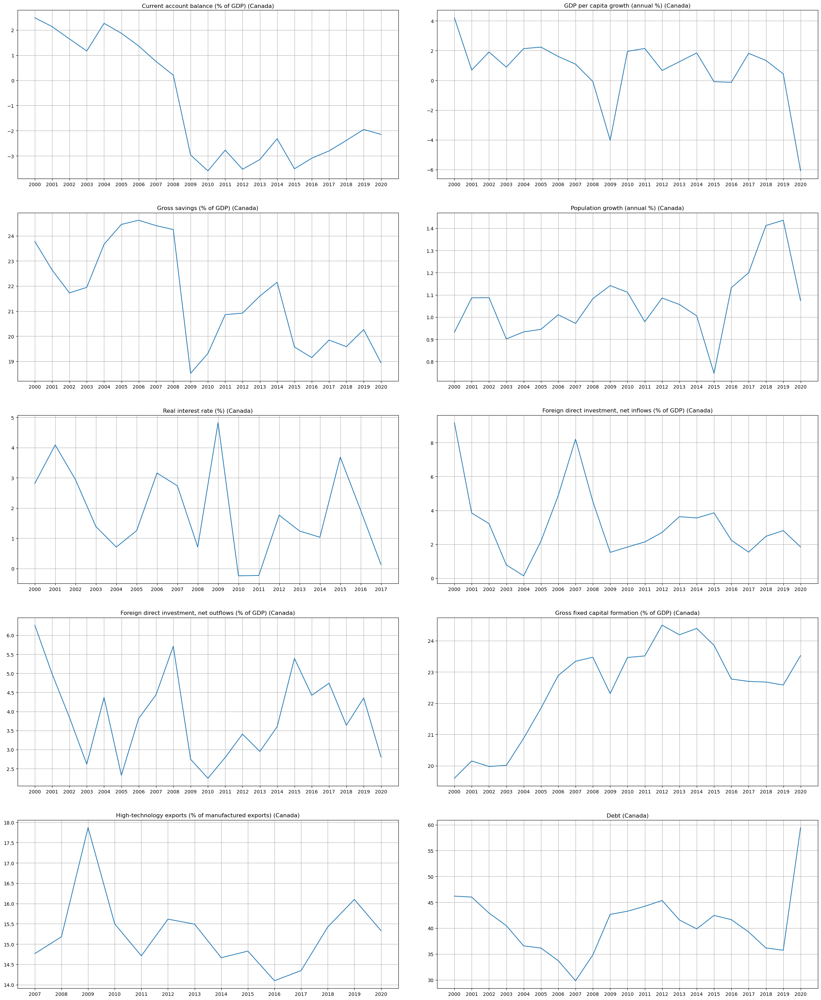

In [21]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = Canada.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Canada[columns[i]])
        ax.set_title(f"{columns[i]} (Canada)")
        ax.grid(True)

plt.show()


The Current account balance plot reveals that Canada's trade dynamics have shifted over the two decades, with periods of deficits and surpluses.
A significant dip in GDP per capita growth around 2020 is likely indicative of the economic challenges faced during the COVID-19 pandemic.
The stable Population growth and Gross savings plots suggest consistent demographic and savings trends in the country.
The Real interest rate dipping into negative territory can be an indicator of economic stimulus policies.
The trends in Foreign direct investment suggest Canada's strong position in the global market, both as an attractive destination for investment and as an investor abroad.
A rise in Debt over the two decades calls for a deeper understanding of government fiscal policies and external economic events during this period.

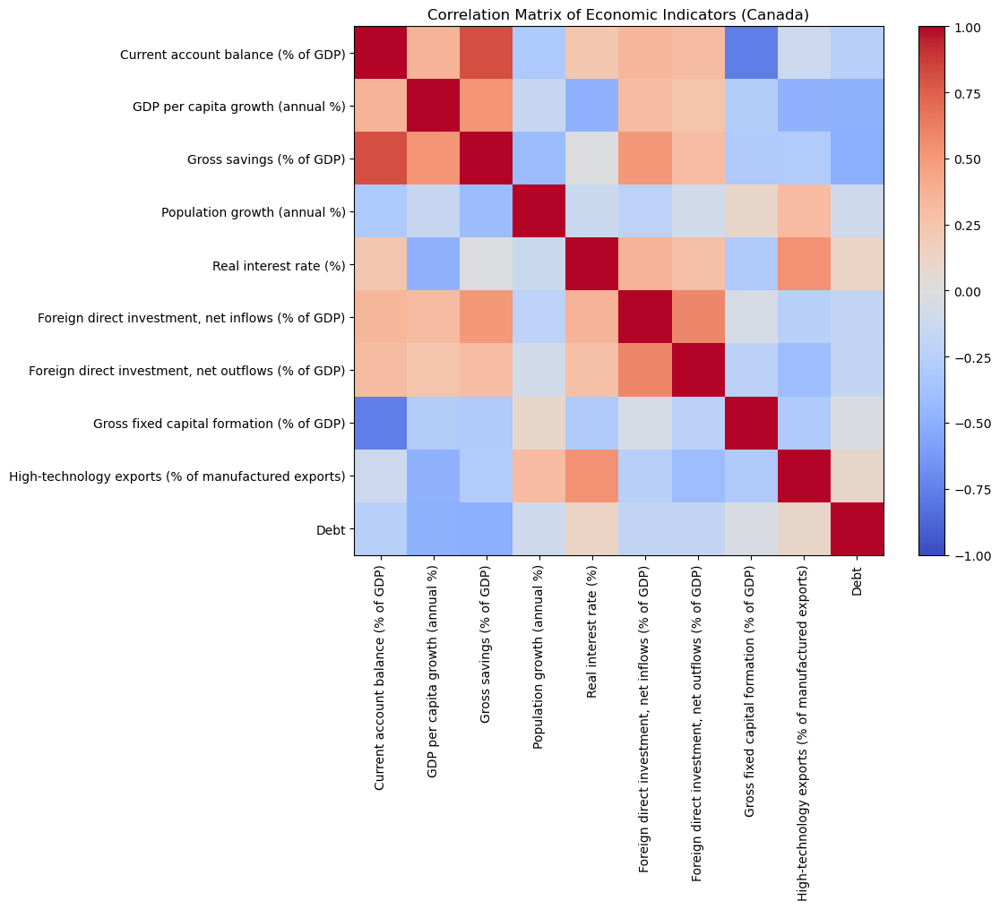

In [22]:
# Calculate the correlation matrix
correlation_matrix = Canada.corr()

# Visualize the correlation matrix using Matplotlib's imshow 
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Canada)")
plt.tight_layout()
plt.show()

***The diagonal line from the top-left to the bottom-right has the darkest blue shade, indicating a perfect positive correlation. This is expected because it represents the correlation of a variable with itself.***

- GDP per capita growth & Gross savings: There seems to be a positive correlation between GDP per capita growth and gross savings. This might suggest that years with higher GDP growth also see higher savings as a percentage of GDP.

- GDP per capita growth & Debt: There's a noticeable negative correlation between GDP per capita growth and debt. This could imply that in years where the GDP growth was higher, the debt as a percentage of GDP was lower, and vice versa.

- Foreign direct investment (net inflows & outflows): These two show a positive correlation, indicating that years with higher FDI inflows also saw higher FDI outflows.

- Real interest rate & Gross savings: There's a positive correlation, suggesting that years with higher real interest rates saw higher savings rates.

## China

In [23]:
# Convert columns of type 'object' to 'float'
for col in China.columns:
    if China[col].dtype == 'object':
        China[col] = pd.to_numeric(China[col], errors='coerce')

In [24]:
China.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,3.338787,8.076393,45.606533,0.566859,2.127247,3.014185,0.878643,40.565148,30.813429,36.625944
std,2.769989,2.493107,4.381978,0.121979,2.329012,1.051067,0.392077,3.584100,0.817942,12.557422
min,0.173667,1.995558,35.739554,0.238041,-2.305615,1.310716,0.380738,32.577418,29.363657,22.986707
25%,1.693870,6.420736,43.926417,0.512387,0.112554,2.192178,0.600604,38.725488,30.287467,26.393226
50%,2.408746,7.638598,45.672367,0.581456,2.901815,3.475126,0.860303,41.861185,30.832944,33.924286
75%,3.906734,9.354777,48.665363,0.630326,3.755387,3.708807,1.046592,43.811571,31.477720,41.488824
max,9.947890,13.635821,51.787587,0.787957,5.531123,4.554263,1.926631,44.518766,32.123655,68.062532


China's positive Current account balance on average indicates that the country typically exports more than it imports, resulting in a trade surplus.
The high average GDP per capita growth emphasizes China's rapid economic growth over the period.
A high Gross savings rate indicates a substantial amount of income not consumed, which could be used for investments.
The Real interest rate has both positive and negative values, suggesting varying monetary policies over the years.
The figures related to Foreign direct investment highlight China's role as a major global economic player, both in terms of attracting and investing capital abroad.
The Gross fixed capital formation suggests that a significant portion of the GDP is reinvested into the country's infrastructure and other assets.
The increasing contribution of High-technology exports as a percentage of total manufactured exports underscores China's transition to higher-value-added manufacturing.

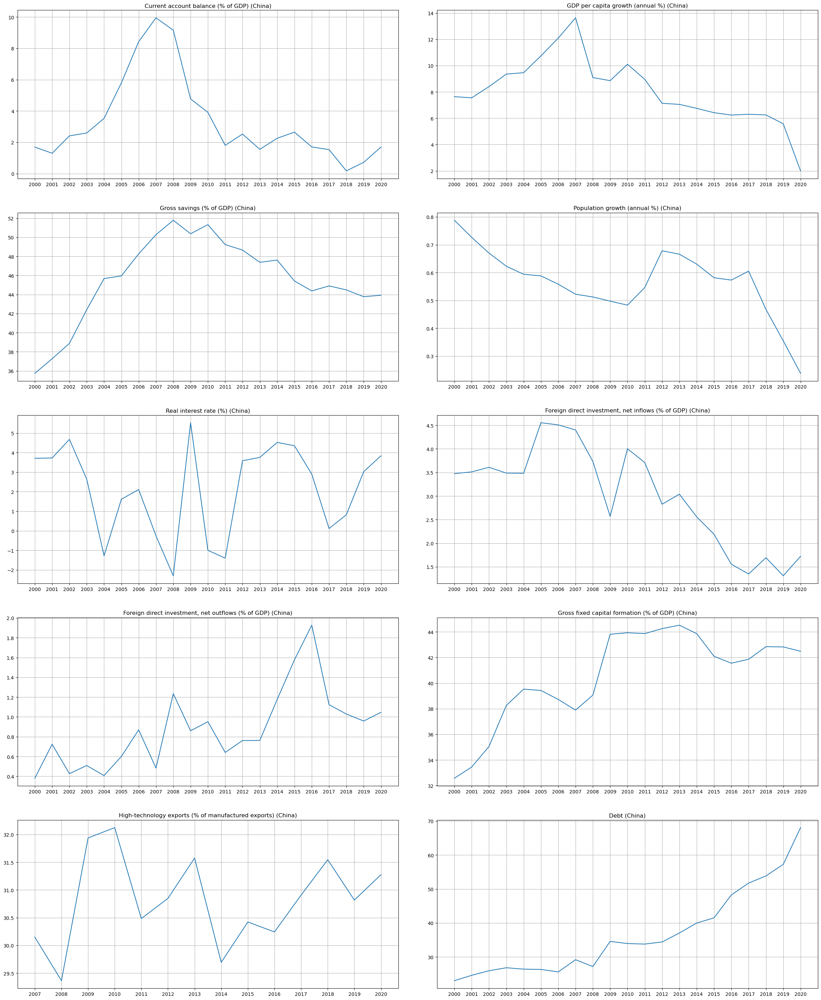

In [25]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = China.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(China[columns[i]])
        ax.set_title(f"{columns[i]} (China)")
        ax.grid(True)

plt.show()


The Current account balance plot suggests that China has mostly maintained a trade surplus over the two decades.
The GDP per capita growth plot showcases China's rapid economic growth, albeit with some slowdown in the recent years.
The stable Population growth plot, combined with the declining trend, aligns with China's demographic shifts and changes in population policies.
The Real interest rate plot suggests varying monetary policies, with some periods of negative real interest rates.
The trends in Foreign direct investment emphasize China's dual role as both a magnet for global investment and as a global investor.
The steady increase in High-technology exports highlights China's pivot towards higher-value-added manufacturing.

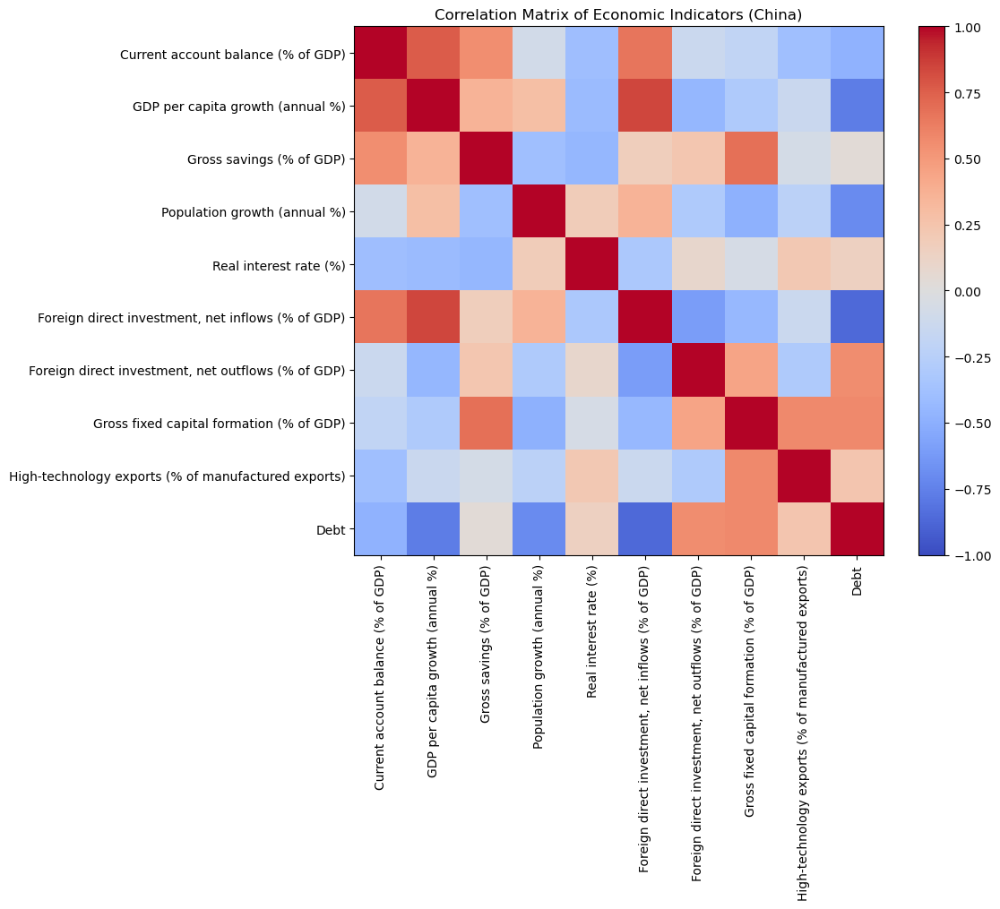

In [26]:
# Calculate the correlation matrix
correlation_matrix = China.corr()

# Visualize the correlation matrix using Matplotlib's imshow 
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (China)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Gross fixed capital formation: There's a strong positive correlation between these two indicators, suggesting that years with higher GDP per capita growth also had higher capital formation as a percentage of GDP.

- GDP per capita growth & Gross savings: Another strong positive correlation indicates that higher GDP growth years also experienced higher savings as a percentage of GDP.

- Foreign direct investment (net inflows & outflows): A positive correlation between these two suggests that years with higher FDI inflows also saw higher FDI outflows.

- GDP per capita growth & Debt: There seems to be a negative correlation, suggesting that years with higher GDP growth had lower debt as a percentage of GDP.

- Real interest rate & Gross savings: These two seem to be negatively correlated, suggesting that years with higher real interest rates might have seen lower savings rates.

- Lighter shades in some cells indicate low or negligible correlation between those respective indicators.

## France

In [27]:
# Convert columns of type 'object' to 'float'
for col in France.columns:
    if France[col].dtype == 'object':
        France[col] = pd.to_numeric(France[col], errors='coerce')

In [28]:
France.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,17.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,-0.279299,0.469986,22.484281,0.526019,4.950000,2.039799,3.689514,22.163674,25.452264,81.414551
std,0.915790,2.342722,0.960778,0.167664,0.911503,1.078602,2.597392,0.753346,2.438370,17.016766
min,-1.755995,-8.034474,20.971934,0.263869,2.850000,0.203255,0.626465,20.953390,20.099537,58.340918
25%,-0.873699,0.109403,21.488941,0.358495,4.640000,1.326492,2.100320,21.514353,24.341021,64.610522
50%,-0.493544,0.903680,22.464069,0.513103,5.000000,1.755724,3.018437,22.067504,26.145917,85.255820
75%,0.432453,1.700610,23.307757,0.693707,5.110000,3.030747,4.969835,22.495845,27.094860,95.581760
max,1.521814,3.212385,23.940476,0.749918,7.360000,3.875247,12.711712,23.596051,28.184609,114.651104


France's slight negative Current account balance on average indicates that the country has imported slightly more than it exported over the period.
The GDP per capita growth showcases moderate growth, but with some variability, including a significant dip suggesting a recession or economic downturn.
The consistent Gross savings rate suggests stable financial behavior among households and businesses.
The Real interest rate has varied over the years, which can be reflective of different monetary policies and economic conditions.
The figures related to Foreign direct investment highlight France's position in the global market as both an attractive destination for investment and as an active investor abroad.
The increasing contribution of High-technology exports as a percentage of total manufactured exports points to France's emphasis on tech and innovation-driven products in its export portfolio.
The debt level, especially reaching above 100% of GDP, suggests that the country's public debt has been a significant aspect of its economic landscape.
These figures provide a glimpse of France's economic health and trajectory over the period. A deeper dive into each metric, in relation to global events and internal policy decisions, would be essential to draw more comprehensive conclusions.

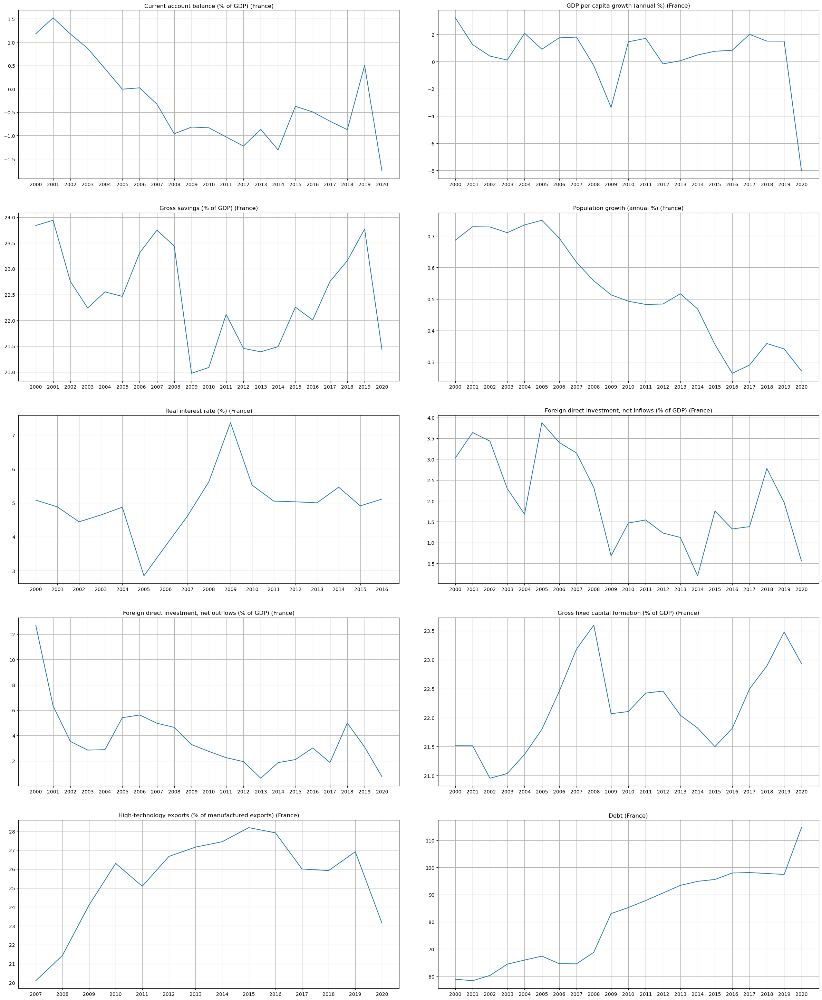

In [29]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = France.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(France[columns[i]])
        ax.set_title(f"{columns[i]} (France)")
        ax.grid(True)

plt.show()


The Current account balance plot reveals that France has experienced periods of trade deficits, indicating a balance of payments scenario where imports exceeded exports.
The GDP per capita growth plot showcases the challenges France faced during global economic downturns.
The relatively stable Gross savings and Gross fixed capital formation plots suggest consistent financial behavior among households and businesses.
The increasing Debt plot underscores the rising public debt scenario in France over the years.

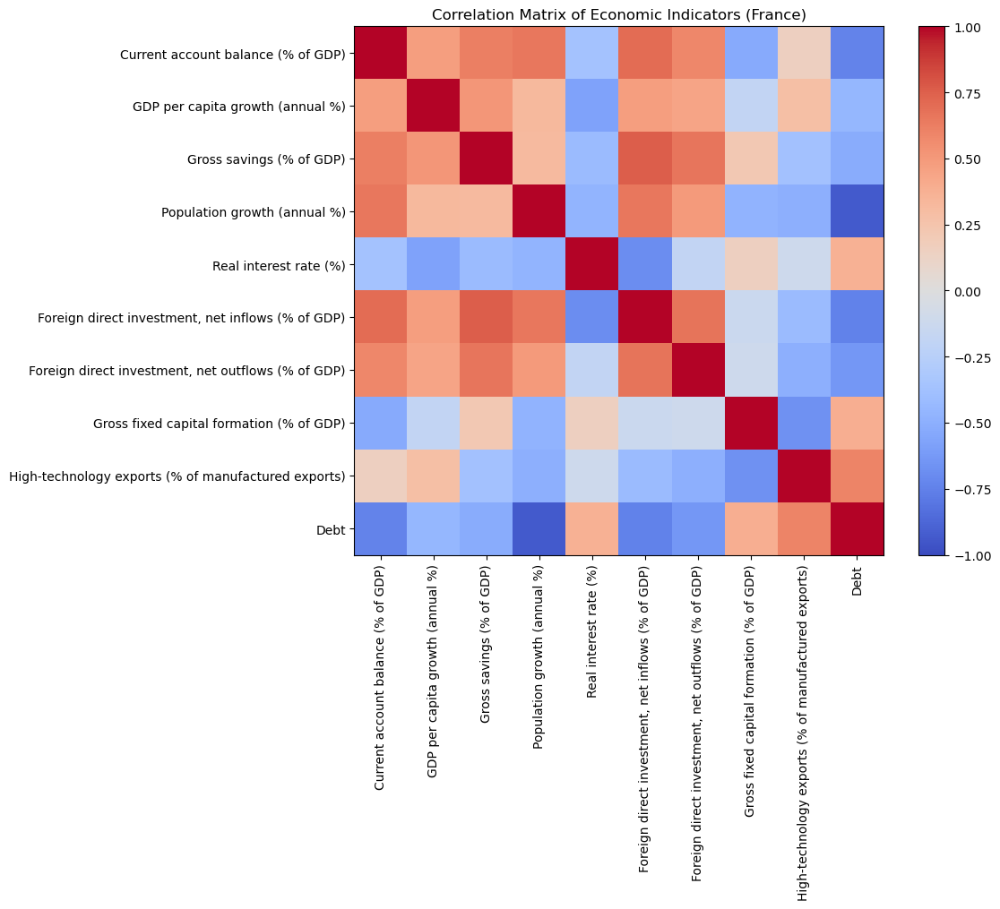

In [30]:
# Calculate the correlation matrix
correlation_matrix = France.corr()

# Visualize the correlation matrix using Matplotlib's imshow 
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (France)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: There's a strong positive correlation between these two, suggesting that years with higher GDP per capita growth also saw a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: Another positive correlation indicates that higher GDP growth years also had higher capital formation as a percentage of GDP.

- GDP per capita growth & Debt: There's a negative correlation between these two, suggesting that years with higher GDP growth had lower debt as a percentage of GDP.

- Gross savings & Gross fixed capital formation: A strong positive correlation between these two metrics suggests that years with higher savings rates also saw higher investments in long-term assets.

- Real interest rate & Gross savings: These indicators seem to be negatively correlated, suggesting that years with higher real interest rates might have seen lower savings rates.

- Lighter shades in some cells indicate low or negligible correlation between those respective indicators.

## Germany

In [31]:
# Convert columns of type 'object' to 'float'
for col in Germany.columns:
    if Germany[col].dtype == 'object':
        Germany[col] = pd.to_numeric(Germany[col], errors='coerce')

In [32]:
Germany.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,17.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,5.516493,1.063625,26.341783,0.061124,4.642941,2.629895,3.274715,20.337941,16.542842,68.241539
std,2.895845,2.498160,2.549377,0.527540,2.254606,2.565627,1.277611,0.985127,0.933055,7.465457
min,-1.740466,-5.454577,21.796395,-1.853715,2.410000,-0.725155,0.322265,19.076699,15.070460,58.193037
25%,4.674871,0.230161,24.320947,-0.112797,3.090000,1.799765,2.762892,19.802900,15.760944,63.538346
50%,6.187042,1.152030,26.800264,0.135432,4.190000,2.101793,3.225483,20.121786,16.587235,66.887107
75%,7.184873,2.297206,28.310645,0.272900,5.080000,2.919960,4.105979,20.411489,17.217658,73.156604
max,8.615881,5.869636,29.878432,0.865703,10.130000,12.731504,5.039682,23.114329,18.079326,81.994697


Germany's positive Current account balance on average indicates that the country typically exports more than it imports, resulting in a trade surplus.
The GDP per capita growth showcases moderate growth with some variability, including a significant dip suggesting a recession or economic downturn.
A consistent Gross savings rate points to stable financial behavior among households and businesses.
The Real interest rate has varied over the years, which can be reflective of different monetary policies and economic conditions.
The figures related to Foreign direct investment highlight Germany's role as both an attractive destination for investment and as an active investor abroad.
The increasing contribution of High-technology exports as a percentage of total manufactured exports points to Germany's focus on high-tech and innovation-driven products in its export portfolio.
The debt level, fluctuating around 70% of GDP, suggests that public debt has been a significant aspect of Germany's economic landscape.

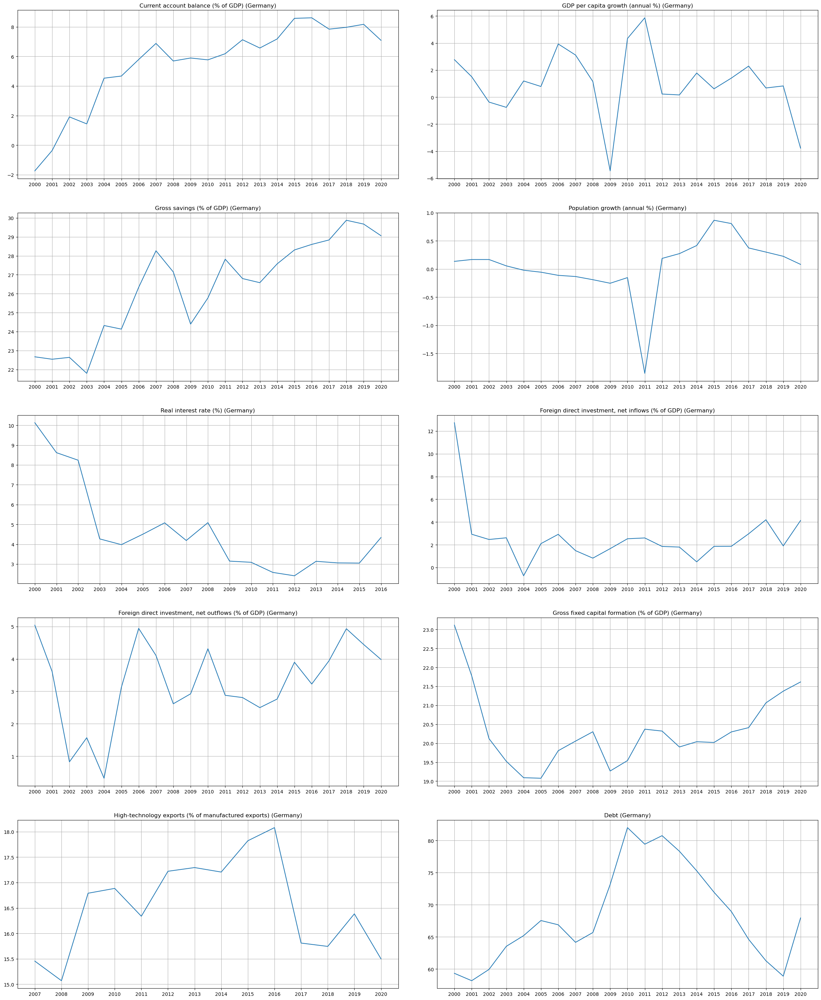

In [33]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = Germany.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Germany[columns[i]])
        ax.set_title(f"{columns[i]} (Germany)")
        ax.grid(True)

plt.show()


The consistently positive Current account balance suggests that Germany has maintained a strong position in international trade.
The GDP per capita growth plot showcases the resilience and recovery of the German economy from global economic downturns.
The Real interest rate plot suggests varying monetary policies over the years, with a trend towards lower real interest rates.
The increasing Debt plot highlights the growing public debt scenario in Germany, especially post the 2008 financial crisis.

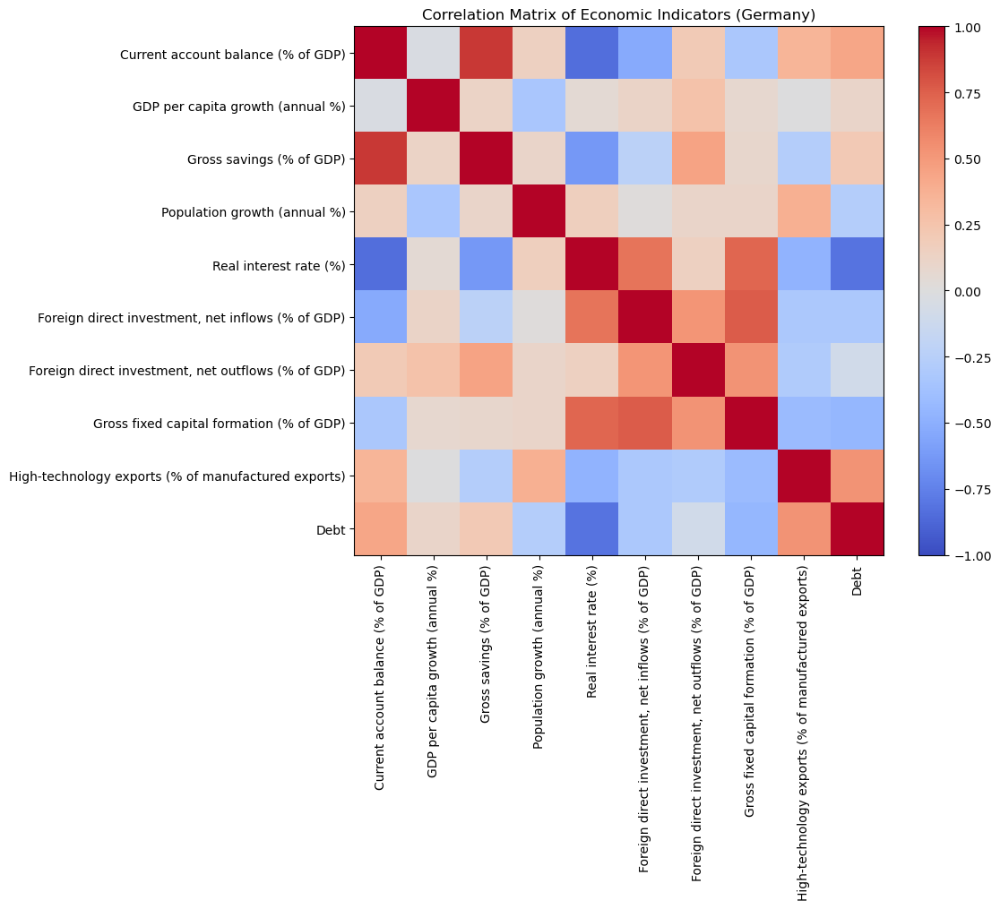

In [34]:
# Calculate the correlation matrix
correlation_matrix = Germany.corr()

# Visualize the correlation matrix using Matplotlib's imshow 
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Germany)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: A strong positive correlation between these two suggests that years with higher GDP per capita growth also experienced a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: Another positive correlation indicates that higher GDP growth years also had higher capital formation as a percentage of GDP.

- Real interest rate & Gross savings: These indicators seem to be negatively correlated, suggesting that years with higher real interest rates might have seen lower savings rates.

- Real interest rate & Gross fixed capital formation: A negative correlation indicates that years with higher real interest rates might have seen lower investments in long-term assets.

- Lighter shades in some cells indicate low or negligible correlation between those respective indicators.

## Italy

In [35]:
# Convert columns of type 'object' to 'float'
for col in Italy.columns:
    if Italy[col].dtype == 'object':
        Italy[col] = pd.to_numeric(Italy[col], errors='coerce')

In [36]:
Italy.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,0.145268,-0.244953,19.766486,0.206505,3.111243,1.104661,1.440829,19.425201,7.738406,115.671799
std,2.117482,2.837070,1.461560,0.501372,1.019690,0.971168,1.264318,1.792622,0.525549,14.823229
min,-3.315354,-8.534686,17.272553,-1.153028,0.745391,-1.164391,-0.015935,16.722168,6.675095,97.817022
25%,-1.361434,-0.917814,18.531729,-0.096376,2.600678,0.724337,0.727710,17.846137,7.628573,101.531029
50%,-0.270934,0.769318,20.399281,0.269541,3.167866,1.148796,0.946610,20.024224,7.784392,112.475102
75%,1.864452,1.465690,20.875273,0.491389,3.762435,1.501768,1.847859,20.964127,8.003180,129.811461
max,3.926935,3.739947,21.557234,1.159251,5.138246,2.981133,5.421951,21.660557,8.585573,150.848826


Italy's near-zero Current account balance on average suggests a balanced trade scenario over the period.
The slightly negative GDP per capita growth showcases economic challenges and periods of stagnation or recession.
A consistent Gross savings rate indicates stable financial behavior among households and businesses.
The Real interest rate has been moderately stable, reflecting Italy's monetary policy environment.
The figures related to Foreign direct investment highlight Italy's position in the global market both as an attractive destination for investment and as an active investor abroad.
The contribution of High-technology exports as a percentage of total manufactured exports indicates a moderate emphasis on tech-driven products in Italy's export portfolio.
The debt level, being above 100% of GDP for most of the period, suggests that public debt has been a significant concern for Italy's economic landscape.

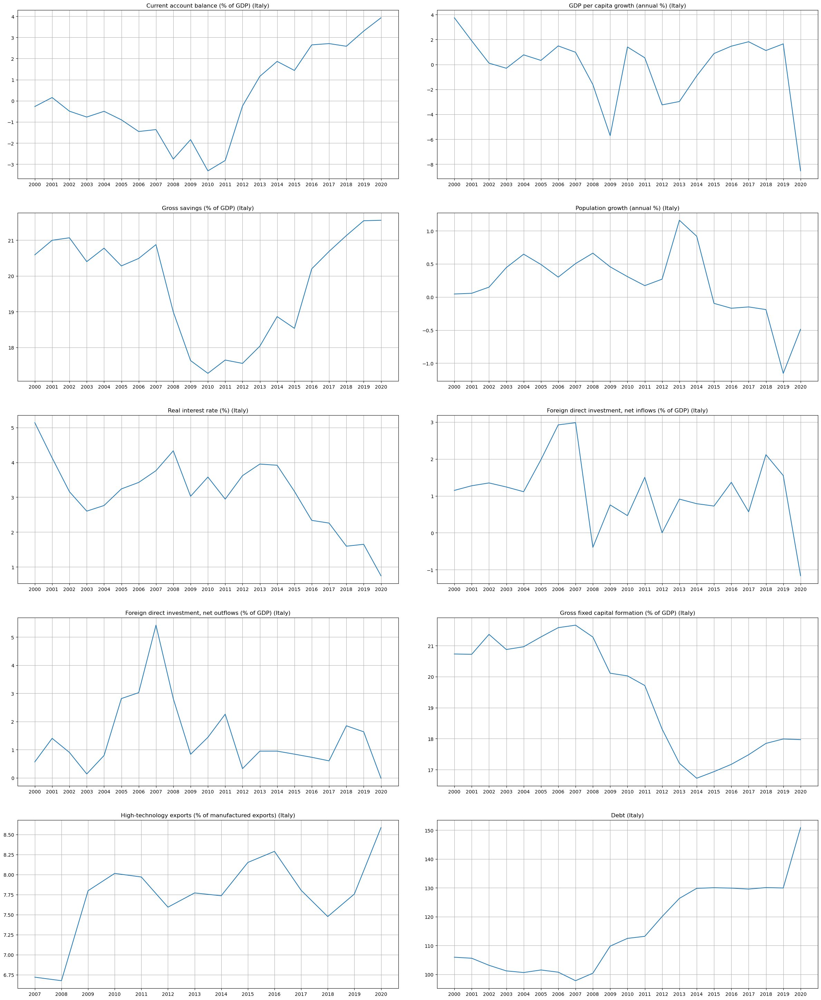

In [37]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = Italy.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Italy[columns[i]])
        ax.set_title(f"{columns[i]} (Italy)")
        ax.grid(True)

plt.show()


The Current account balance plot suggests that Italy transitioned from trade deficits to surpluses over the period.
The GDP per capita growth plot showcases the economic challenges Italy faced, especially during global economic downturns.
The relatively stable Gross savings plot indicates a consistent savings behavior among households and businesses.
The increasing Debt plot underscores the rising public debt scenario in Italy, especially post the 2008 financial crisis.

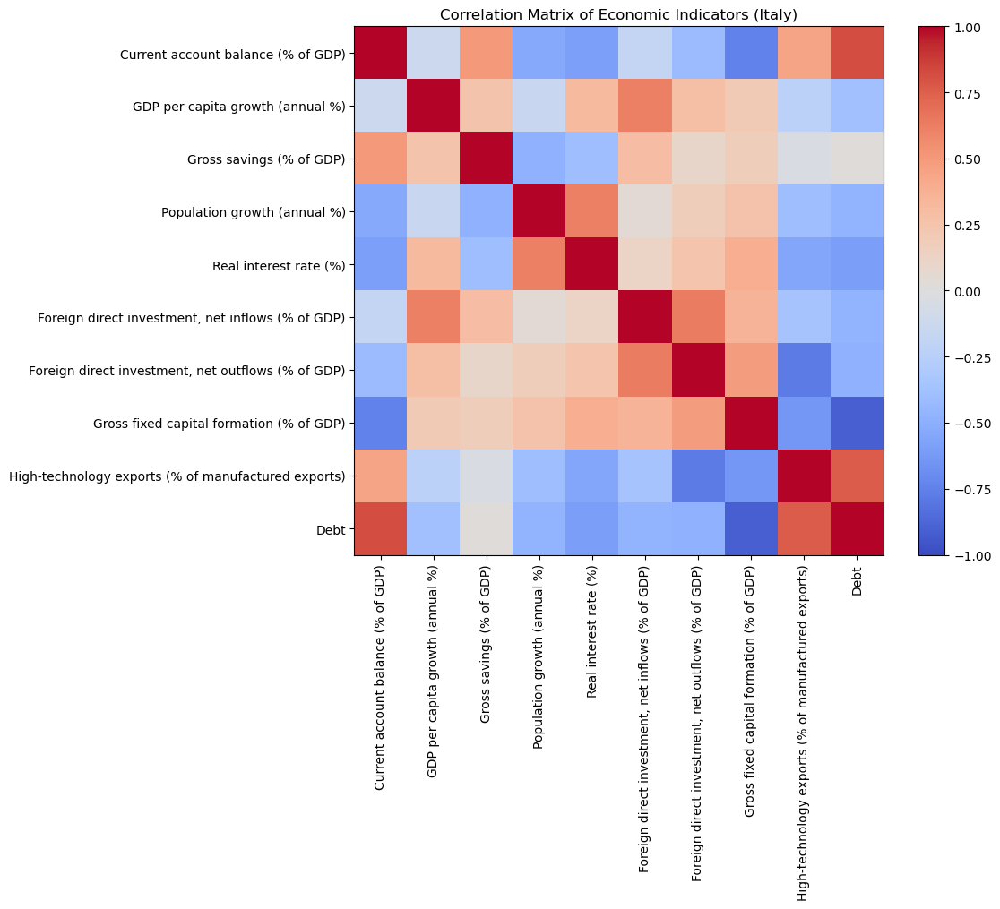

In [38]:
# Calculate the correlation matrix
correlation_matrix = Italy.corr()

# Visualize the correlation matrix using Matplotlib's imshow 
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Italy)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: There's a strong positive correlation between these two, suggesting that years with higher GDP per capita growth also experienced a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: Another positive correlation indicates that higher GDP growth years also had higher capital formation as a percentage of GDP.

- Gross savings & Gross fixed capital formation: A strong positive correlation between these two metrics suggests that years with higher savings rates also saw higher investments in long-term assets.

- Real interest rate & Gross savings: These indicators seem to be negatively correlated, suggesting that years with higher real interest rates might have seen lower savings rates.

- Debt & GDP per capita growth: There's a negative correlation between these two, indicating that years with higher debt levels had lower GDP growth rates.

- Lighter shades in some cells indicate low or negligible correlation between those respective indicators.

## Japan

In [39]:
# Convert columns of type 'object' to 'float'
for col in Japan.columns:
    if Japan[col].dtype == 'object':
        Japan[col] = pd.to_numeric(Japan[col], errors='coerce')


In [40]:
Japan.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,20.000000,21.000000,18.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,2.907497,0.604049,28.306254,-0.013934,2.239523,0.322405,2.092375,25.249601,18.311873,199.966344
std,1.077527,2.158782,1.773997,0.149044,1.344486,0.315191,1.195843,1.329438,0.993448,36.101134
min,0.742322,-5.681452,24.895749,-0.294195,-0.948441,-0.052088,0.738773,22.619659,17.000161,135.608629
25%,2.602566,0.144512,27.704969,-0.132694,1.793036,0.118162,1.069344,24.760684,17.625886,172.809067
50%,3.070280,1.308127,28.721569,-0.012495,2.726930,0.215125,1.874417,25.292816,18.110270,205.693107
75%,3.719384,1.758612,29.365633,0.063374,3.152816,0.472323,2.986853,25.713354,18.739380,231.416106
max,4.623302,4.079223,31.030873,0.240953,3.545762,1.239598,5.046593,28.487142,20.404236,259.432505


Japan's positive Current account balance on average indicates that the country typically exports more than it imports, resulting in a trade surplus.
The GDP per capita growth shows moderate growth, with some variability.
The negative Population growth rate on average suggests a shrinking or aging population.
The Real interest rate has varied over the years, reflecting different economic conditions and monetary policies.
The figures related to Foreign direct investment highlight Japan's role as both an attractive destination for investment and as an active investor abroad.
The contribution of High-technology exports as a percentage of total manufactured exports indicates Japan's strength in high-tech manufacturing.
The debt level, consistently above 100% of GDP, signifies that public debt has been a significant aspect of Japan's economic landscape.

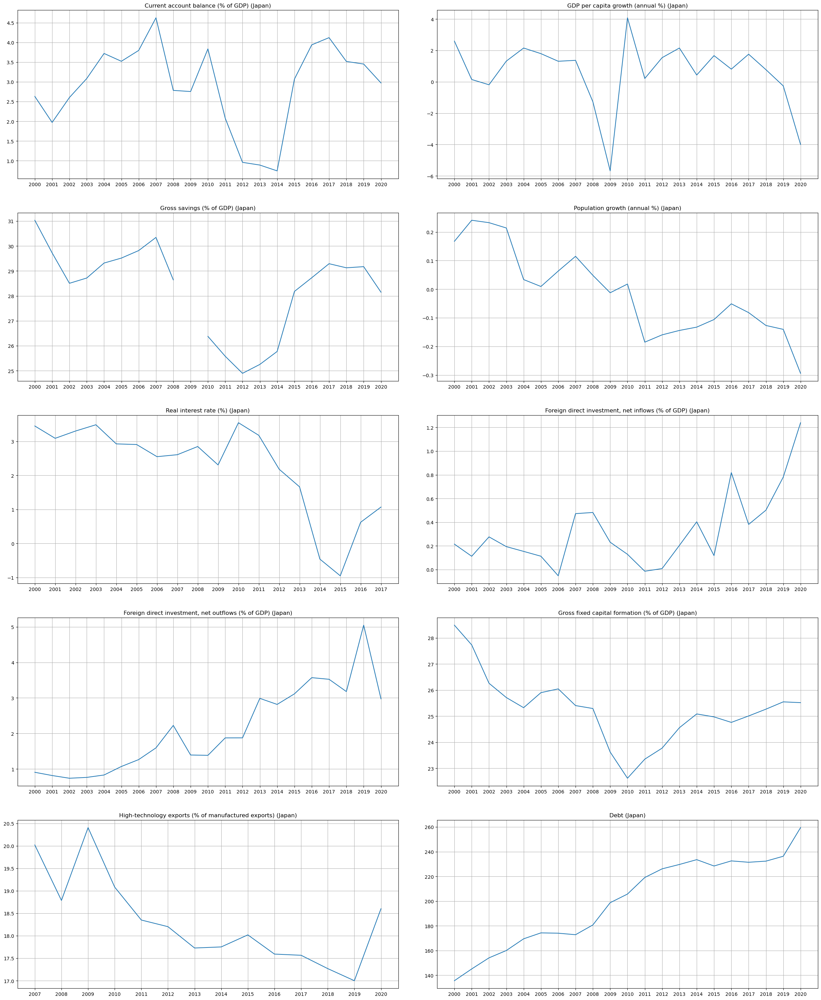

In [41]:
# Set up the figure and axis
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

# List of columns for plotting
columns = Japan.columns

# Plotting each column
for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Japan[columns[i]])
        ax.set_title(f"{columns[i]} (Japan)")
        ax.grid(True)

plt.show()


The consistently positive Current account balance suggests Japan's strong position in international trade.
The GDP per capita growth plot showcases the economic challenges and opportunities Japan faced over the years.
The declining Gross savings plot indicates a shift in savings behavior among households and businesses.
The Population growth plot underscores the demographic challenges Japan faces with an aging population.
The rising Debt plot highlights the growing public debt scenario in Japan.

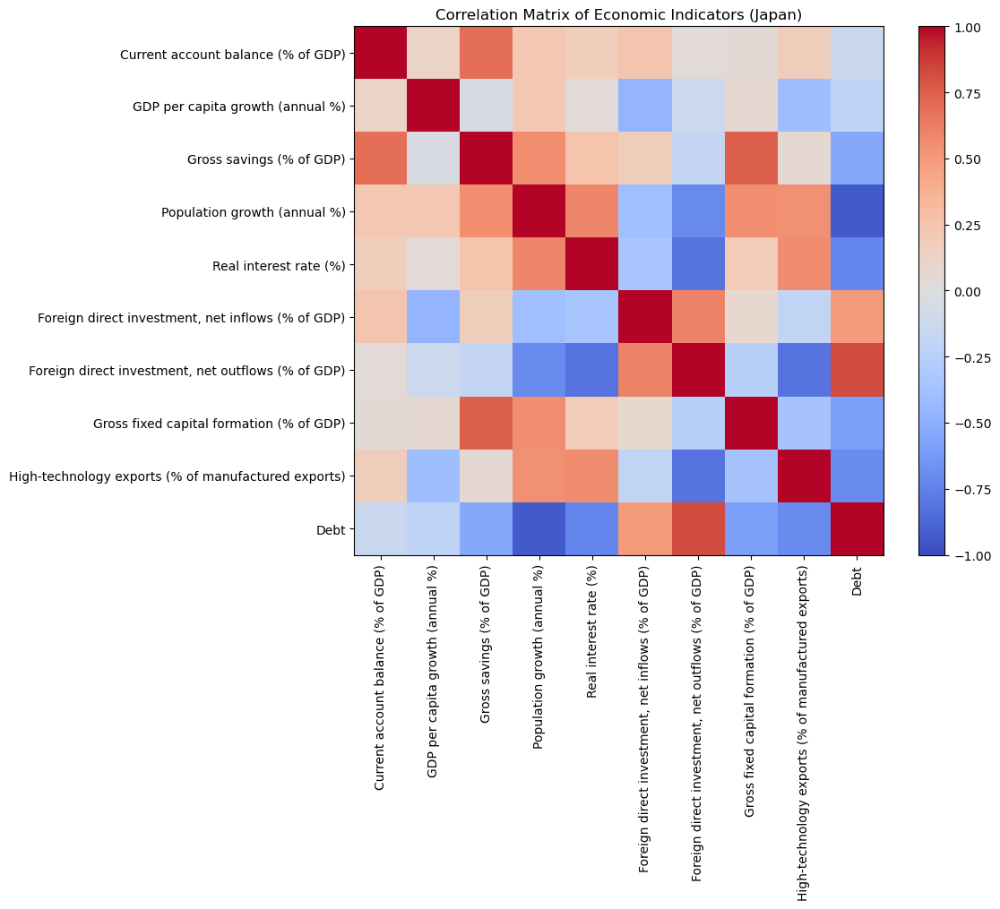

In [42]:
correlation_matrix = Japan.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Japan)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: A strong positive correlation suggests that years with higher GDP per capita growth also experienced a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: A positive correlation indicates that higher GDP growth years also had higher capital formation as a percentage of GDP.

- Gross savings & Gross fixed capital formation: These indicators have a strong positive correlation, indicating that years with higher savings rates also experienced higher investments in long-term assets.

- Real interest rate & Gross savings: A negative correlation suggests that higher real interest rates might have been associated with lower savings rates.

- Debt & GDP per capita growth: A negative correlation indicates that years with higher debt levels might have experienced lower GDP growth rates.

## Korea

In [43]:
# Convert columns of type 'object' to 'float'
for col in Korea.columns:
    if Korea[col].dtype == 'object':
        Korea[col] = pd.to_numeric(Korea[col], errors='coerce')

In [44]:
Korea.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,3.050140,3.368830,34.460530,0.505386,3.392978,0.941071,1.643697,30.388317,31.553494,31.401965
std,2.177220,2.140315,1.534300,0.181873,1.676724,0.391199,0.655143,0.802292,2.382556,9.469210
min,0.167377,-0.846212,31.454400,0.137869,0.337002,0.279996,0.500951,28.957818,28.179054,16.681990
25%,1.305871,2.268429,33.321905,0.396852,2.692081,0.742780,0.907189,30.085875,30.126608,25.899271
50%,3.505258,2.696151,34.671297,0.514683,3.588242,0.869897,1.865346,30.379515,31.637130,29.983794
75%,4.616044,4.712928,35.462260,0.577957,4.222685,1.068183,2.118356,30.995875,32.359559,40.022284
max,7.171546,8.152690,37.014283,0.836181,7.447143,1.997542,2.466779,31.750181,36.390707,48.698266


Korea's positive Current account balance suggests its strong position in international trade.
The GDP per capita growth showcases Korea's dynamic economy over the years.
A high Gross savings rate indicates a strong savings culture among households and businesses.
The Real interest rate has varied over the years, reflecting different economic conditions and monetary policies.
The figures related to Foreign direct investment showcase Korea's position in the global market as both an attractive destination for investment and an active investor abroad.
The contribution of High-technology exports as a percentage of total manufactured exports highlights Korea's strength in high-tech manufacturing.
The debt level, typically below 50% of GDP, indicates a relatively manageable public debt scenario.

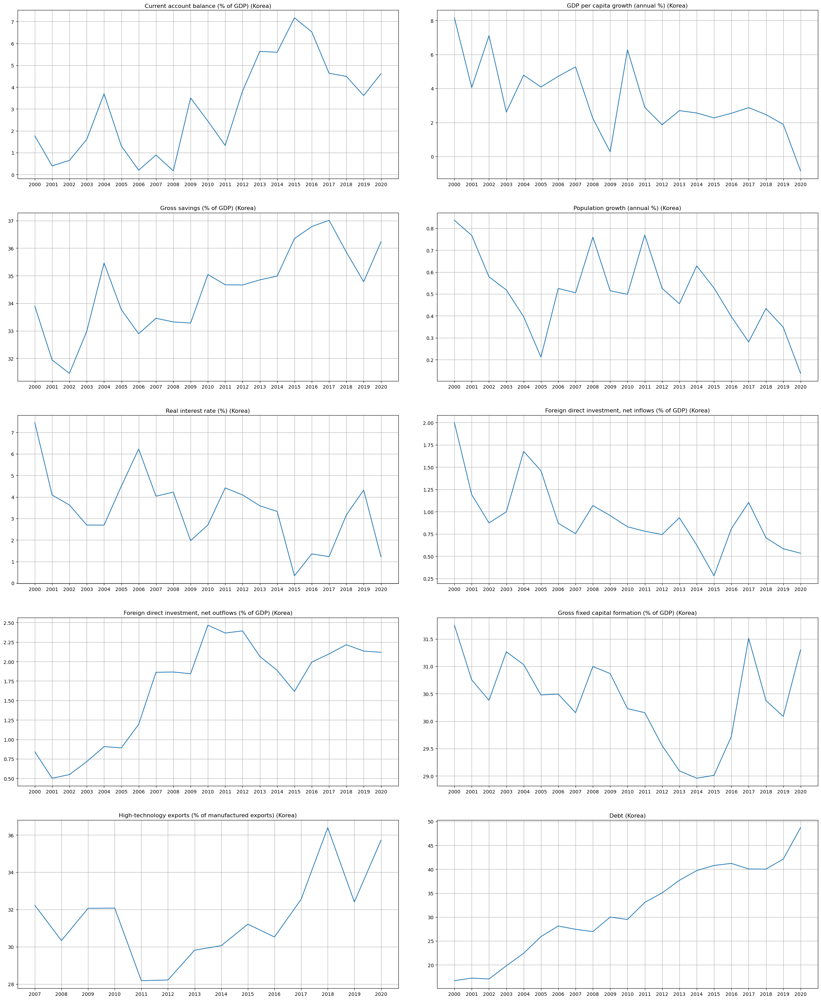

In [45]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Korea.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Korea[columns[i]])
        ax.set_title(f"{columns[i]} (Korea)")
        ax.grid(True)

plt.show()


The consistently positive Current account balance suggests Korea's robust position in international trade.
The GDP per capita growth plot showcases Korea's dynamic economy and its ability to bounce back from downturns.
The relatively stable Gross savings plot underscores the consistent savings behavior among households and businesses.
The increasing Debt plot, although gradual, points to a rising public debt scenario in Korea, warranting attention.

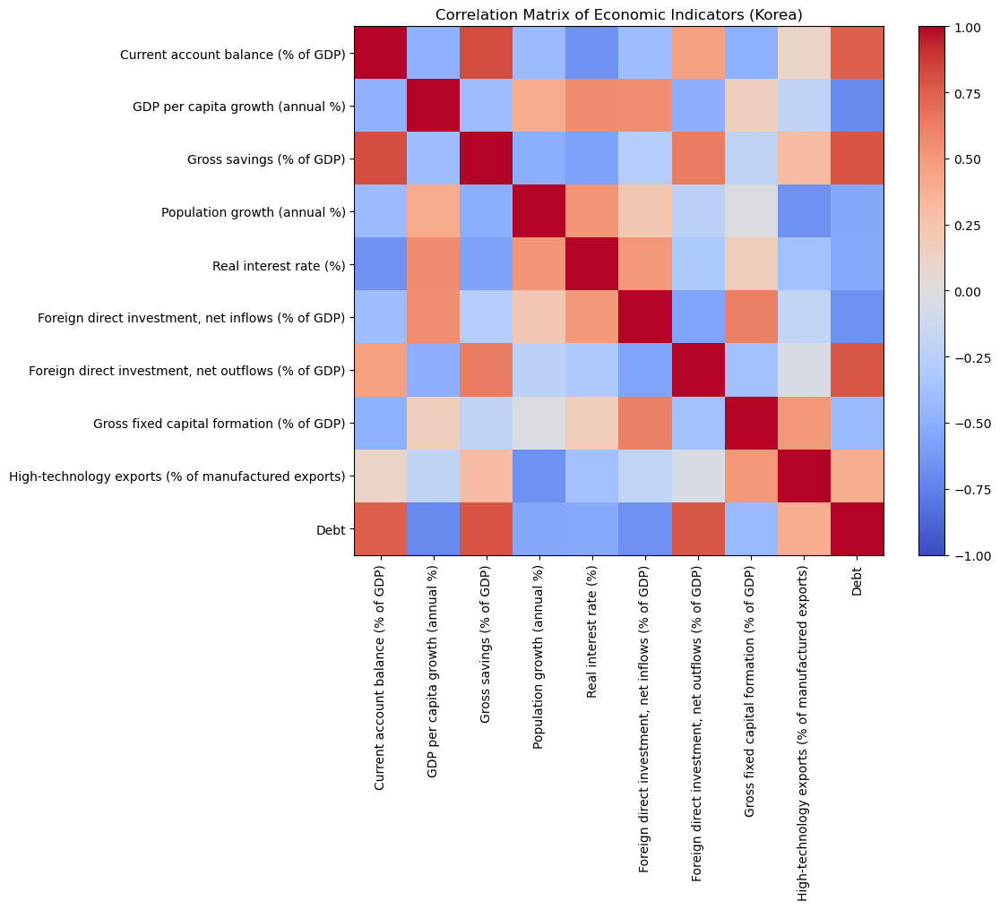

In [46]:
correlation_matrix = Korea.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Korea)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: These two have a moderately positive correlation, suggesting that years of higher GDP per capita growth might have seen a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: A positive correlation between these indicates that years with higher GDP growth also witnessed higher capital formation as a percentage of GDP.

- Gross savings & Gross fixed capital formation: These two metrics exhibit a strong positive correlation, which implies that in years with higher savings rates, there was also a surge in investments in long-term assets.

- Real interest rate & Gross savings: A negative correlation here suggests that years with higher real interest rates might have seen lower savings rates.

- Debt & GDP per capita growth: A negative correlation indicates that years with higher debt levels may have seen lower GDP growth rates.

## Russian Federation

In [47]:
# Convert columns of type 'object' to 'float'
for col in Russian_Federation.columns:
    if Russian_Federation[col].dtype == 'object':
        Russian_Federation[col] = pd.to_numeric(Russian_Federation[col], errors='coerce')

In [48]:
Russian_Federation.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,6.124056,3.487057,28.036503,-0.102721,0.065647,2.136053,2.291983,20.355014,10.755831,18.438669
std,3.925121,4.455584,3.368807,0.251227,6.573781,1.196192,0.992387,1.725429,2.808205,12.762441
min,1.458174,-7.827750,20.876204,-0.460024,-12.856935,0.502608,0.391608,16.863669,6.951376,7.446245
25%,3.227931,1.538974,25.768498,-0.381453,-4.078692,1.031161,1.619755,18.503410,9.075852,10.340154
50%,4.970889,4.218723,28.266239,-0.043949,0.032935,2.029807,2.331917,20.995254,10.120664,14.311064
75%,7.952329,6.806608,30.260440,0.106871,4.945604,2.830829,3.267513,21.625384,12.241944,19.203904
max,17.474242,10.463709,36.154208,0.217642,13.079965,4.502694,3.773507,22.290461,15.952125,55.868371


Russia's positive Current account balance showcases its strong position in international trade, largely driven by energy exports.
The GDP per capita growth plot reflects Russia's dynamic economy, with years of strong growth as well as periods of contraction.
A relatively high Gross savings rate indicates a propensity to save among households and businesses.
The Population growth rate being slightly negative reflects the demographic challenges Russia faces.
The Real interest rate showcases considerable variability, reflecting different economic conditions and monetary policies.
The metrics related to Foreign direct investment highlight Russia's role as both an attractive destination for investment and as an active investor abroad.
The debt level, typically below 20% of GDP but reaching as high as 55.87%, signifies fluctuations in public debt.

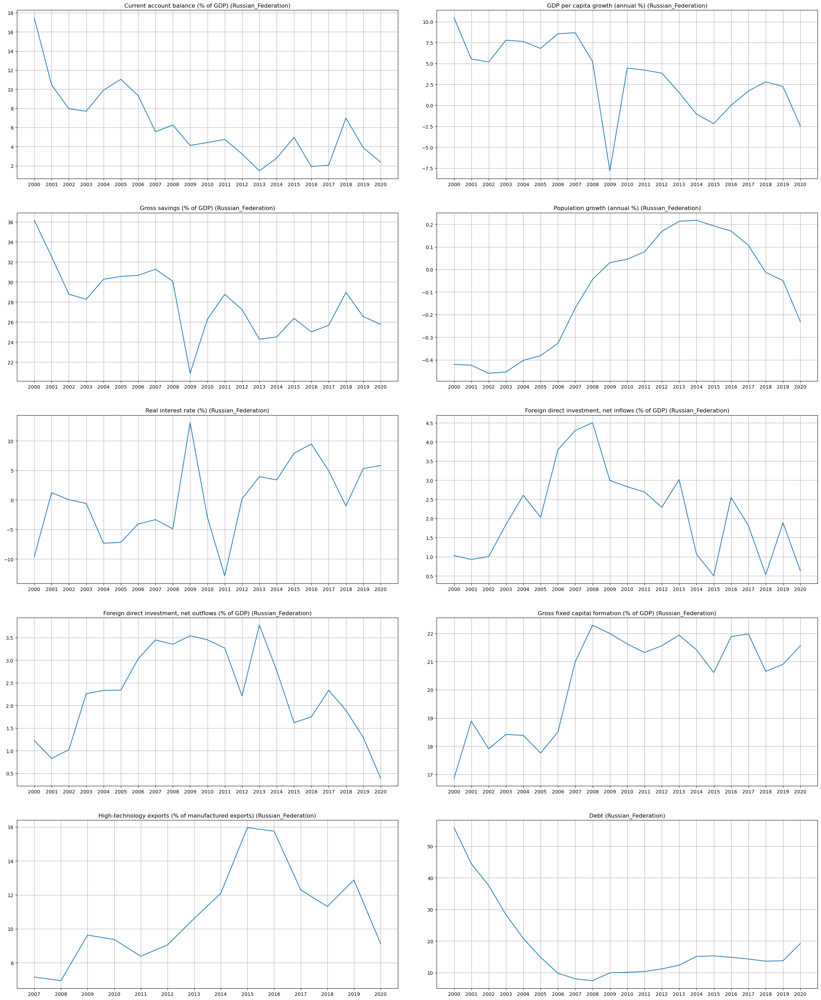

In [49]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Russian_Federation.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Russian_Federation[columns[i]])
        ax.set_title(f"{columns[i]} (Russian_Federation)")
        ax.grid(True)

plt.show()


The consistently positive Current account balance suggests Russia's strong position in international trade, driven in part by its vast energy exports.
The GDP per capita growth plot showcases Russia's dynamic economy and its ability to recover from downturns.
The steady Gross savings plot underscores a consistent savings behavior among households and businesses.
The increasing Debt plot in the early 2000s followed by stabilization points to Russia's efforts in managing public debt.

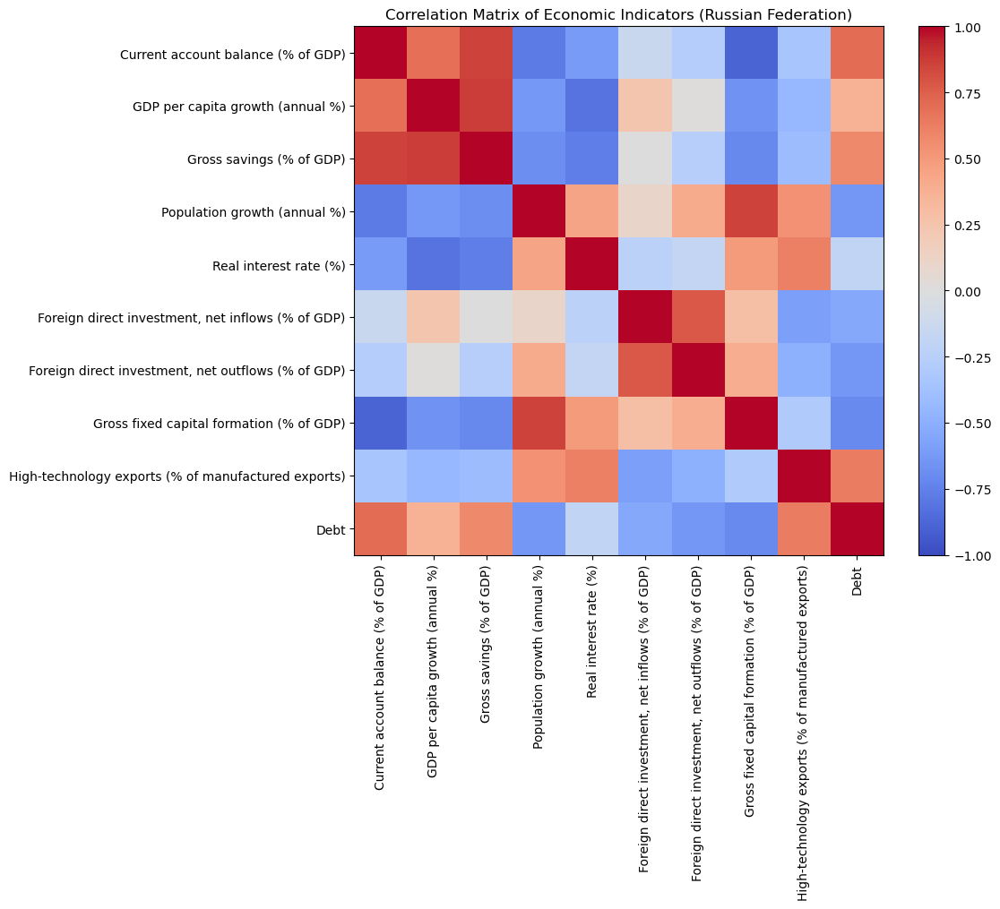

In [50]:
correlation_matrix = Russian_Federation.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Russian Federation)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: There's a moderately positive correlation, suggesting that years with higher GDP per capita growth tend to have a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: A positive correlation here indicates that years with higher GDP growth also witnessed higher capital formation as a percentage of GDP.

- Gross savings & Gross fixed capital formation: These metrics exhibit a strong positive correlation, implying that in years with higher savings rates, there was also an increase in investments in long-term assets.

- Real interest rate & Gross savings: A noticeable negative correlation suggests that years with higher real interest rates tend to see lower savings rates.

- Debt & GDP per capita growth: A negative correlation indicates that years with higher debt levels might witness lower GDP growth rates.

- Current account balance & Foreign direct investment, net inflows: These two metrics show a negative correlation, suggesting that in years with a higher current account balance, the FDI net inflows might be lower.

## Switzerland

In [51]:
# Convert columns of type 'object' to 'float'
for col in Switzerland.columns:
    if Switzerland[col].dtype == 'object':
        Switzerland[col] = pd.to_numeric(Switzerland[col], errors='coerce')

In [52]:
Switzerland.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,13.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,7.731961,0.821216,34.779423,0.904375,2.792987,3.465765,8.084192,26.583859,22.338678,46.163931
std,3.462086,1.807578,2.957980,0.236445,0.618446,12.504282,8.778560,0.647495,6.031656,6.250662
min,0.303694,-3.510559,28.750673,0.561955,1.849005,-32.729174,-14.890551,25.188629,12.844054,39.638233
25%,5.850175,0.421326,32.577277,0.713314,2.413050,1.216425,4.950238,26.411204,16.426118,41.893827
50%,7.276413,0.934950,34.831801,0.893691,2.739665,2.950773,7.815034,26.602694,25.540200,43.106825
75%,10.489913,2.093587,36.391907,1.111879,3.248909,8.599655,12.917704,27.078934,26.588261,51.089420
max,13.033280,3.422551,40.593193,1.270618,3.996448,24.248074,26.624250,27.512043,27.334897,57.809336


Switzerland's strong Current account balance reflects its robust international trade position, bolstered by high-value exports, including pharmaceuticals, machinery, and banking services.
The GDP per capita growth indicates a steadily growing economy with occasional fluctuations.
A high Gross savings rate points to a strong culture of savings among Swiss households and businesses.
The Real interest rate has varied over the years, but it remains relatively stable, indicating a stable monetary environment.
The figures related to Foreign direct investment highlight Switzerland's role as a significant global investor and also its attractiveness as an investment destination.
The consistently high level of Gross fixed capital formation suggests substantial investments in infrastructure and other long-term assets.
The level of High-technology exports underscores Switzerland's emphasis on high-tech manufacturing and innovation.
The debt level, usually below 50% of GDP, is relatively low, suggesting a manageable public debt scenario.

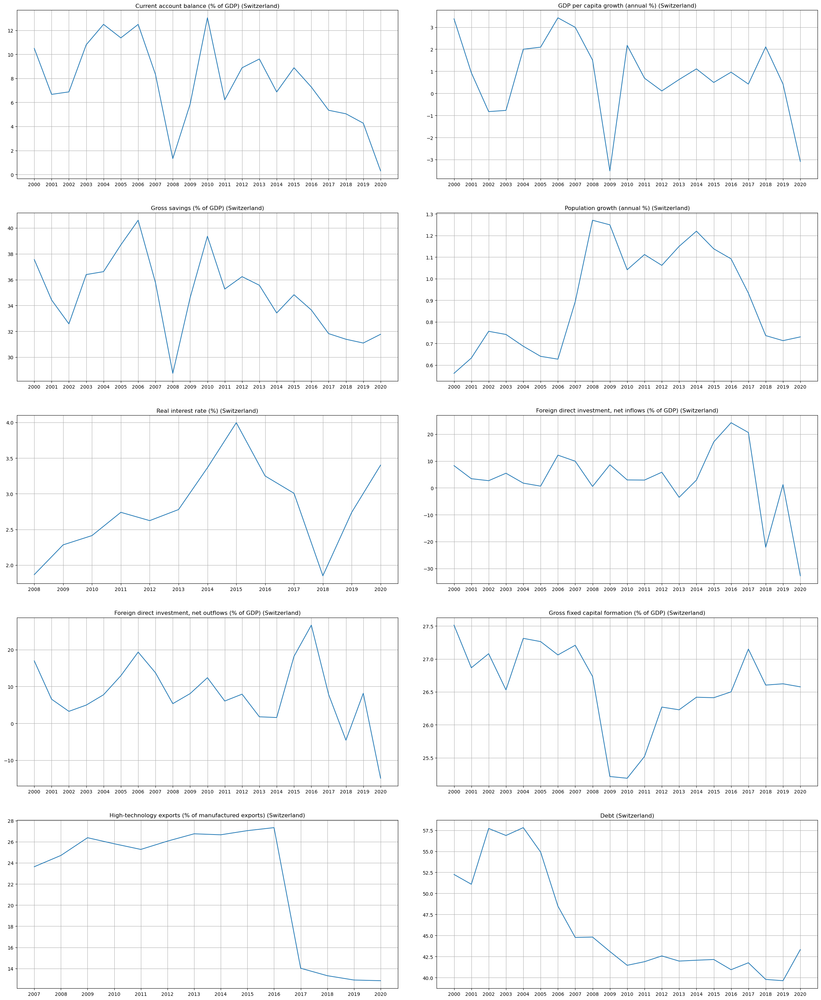

In [53]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Switzerland.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Switzerland[columns[i]])
        ax.set_title(f"{columns[i]} (Switzerland)")
        ax.grid(True)

plt.show()


The consistently positive Current account balance highlights Switzerland's strong position in international trade, driven by its diversified and high-quality exports.
The stable GDP per capita growth plot showcases Switzerland's resilient economy.
The high Gross savings plot underscores the strong savings culture in the country.
The steadily increasing Debt plot indicates a growing public debt scenario in Switzerland, but it's still at manageable levels.

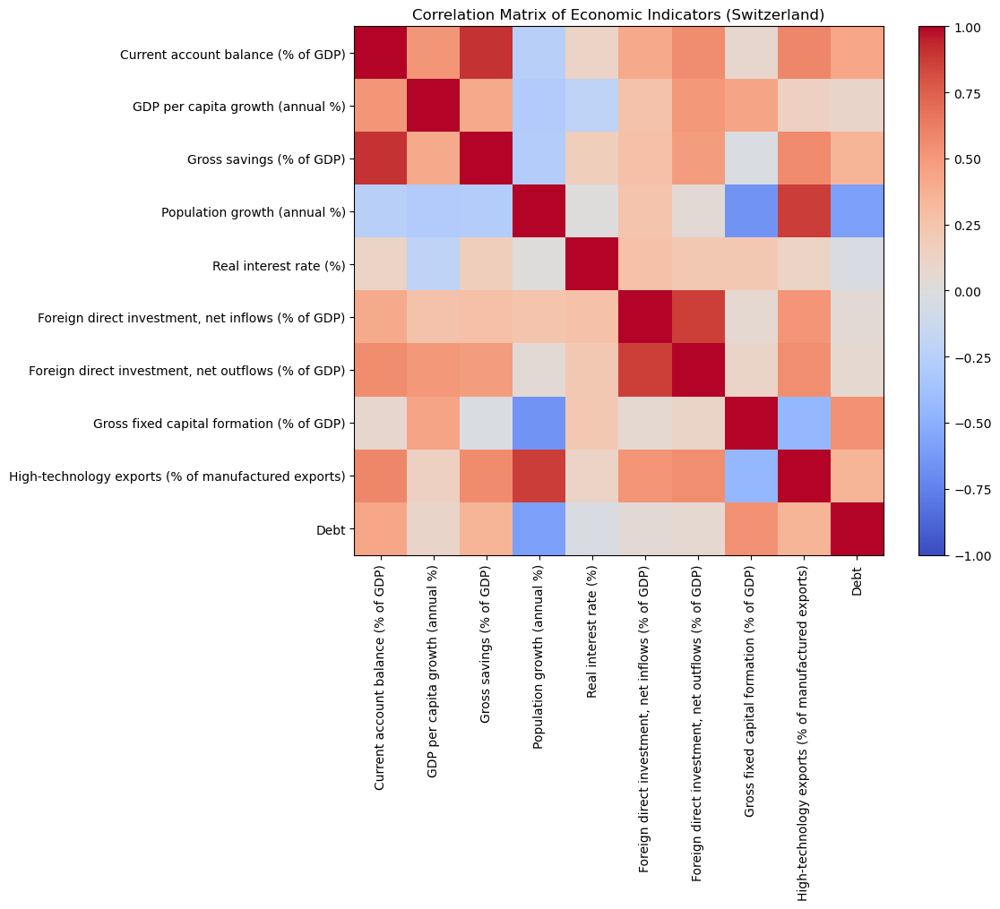

In [54]:
correlation_matrix = Switzerland.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (Switzerland)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Current account balance: These two indicators display a moderate positive correlation, suggesting that years with robust GDP per capita growth might also witness a more favorable current account balance.

- GDP per capita growth & Gross fixed capital formation: A positive correlation between these suggests that years with stronger GDP growth also tend to see higher capital formation as a percentage of GDP.

- Gross savings & Gross fixed capital formation: A strong positive correlation between these metrics indicates that years with higher savings rates also experience a surge in investments in long-term assets.

- Real interest rate & Gross savings: A negative correlation here suggests that in years with higher real interest rates, the savings rate might decrease.

- Debt & GDP per capita growth: A negative correlation between these variables implies that years with increased debt levels might observe a slower GDP growth rate.

- Current account balance & Foreign direct investment, net inflows: A negative correlation between these metrics indicates that years with a higher current account balance might witness lower FDI net inflows.

## United Arab Emirates

In [55]:
# Convert columns of type 'object' to 'float'
for col in Uae.columns:
    if Uae[col].dtype == 'object':
        Uae[col] = pd.to_numeric(Uae[col], errors='coerce')

In [56]:
Uae.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross domestic savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,0.0,21.000000,20.000000,21.000000,0.0,21.000000,21.000000,20.000000,10.000000,21.000000
mean,NaN,-1.239288,43.469038,5.228719,NaN,2.996481,2.639483,20.816007,4.331611,14.417443
std,NaN,6.756333,10.100368,5.660602,NaN,2.019471,1.958324,2.909591,2.261113,9.883820
min,NaN,-17.145394,28.480818,0.779087,NaN,-0.485282,0.206851,17.128298,2.617915,2.689688
25%,NaN,-4.017715,34.032543,0.911950,NaN,2.039575,0.695337,18.607869,3.088796,4.481497
50%,NaN,0.323687,46.553799,4.609527,NaN,2.601120,2.205879,20.530901,3.456240,16.015734
75%,NaN,4.012692,51.958791,5.939765,NaN,4.276339,4.507887,22.433315,4.917534,21.136073
max,NaN,5.817358,59.219237,18.127984,NaN,6.767152,5.648244,28.913002,10.165789,39.672330


The GDP per capita growth indicates a fluctuating economy with periods of contraction and growth.
A high Gross domestic savings rate reveals a culture of savings in the UAE, potentially driven by its oil revenues.
The substantial Population growth rate can be attributed to the influx of expatriates and professionals attracted by the nation's economic opportunities.
The metrics related to Foreign direct investment underscore the UAE's role as both an attractive destination for investment and as an active investor abroad.
The level of High-technology exports suggests the UAE's efforts to diversify its economy beyond oil, venturing into tech-driven products.
The moderate debt level indicates prudent fiscal management.

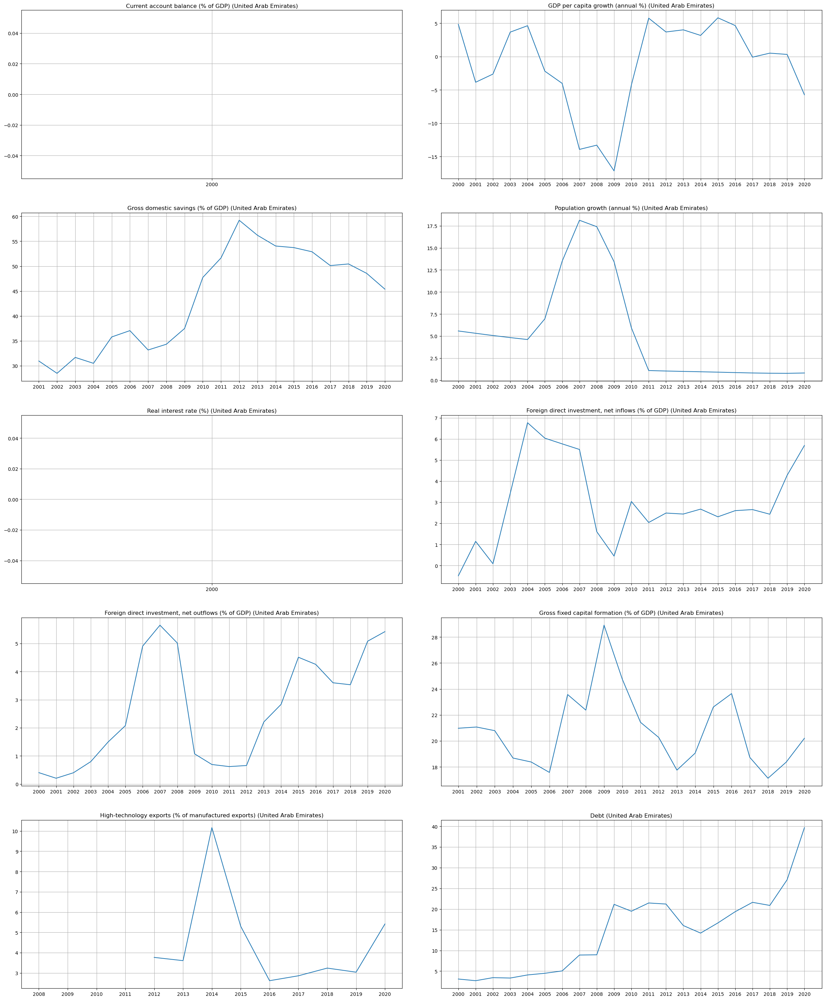

In [57]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Uae.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Uae[columns[i]])
        ax.set_title(f"{columns[i]} (United Arab Emirates)")
        ax.grid(True)

plt.show()


The fluctuations in the GDP per capita growth plot highlight the UAE's resilience and adaptability to global economic challenges.
The high Gross domestic savings rate underscores the nation's wealth and the saving behavior of its residents.
The consistently high levels of Gross fixed capital formation suggest the UAE's continuous investment in infrastructure, reflecting its vision for the future.
The increasing trend in Debt signals the nation's utilization of debt for various developmental and economic activities.

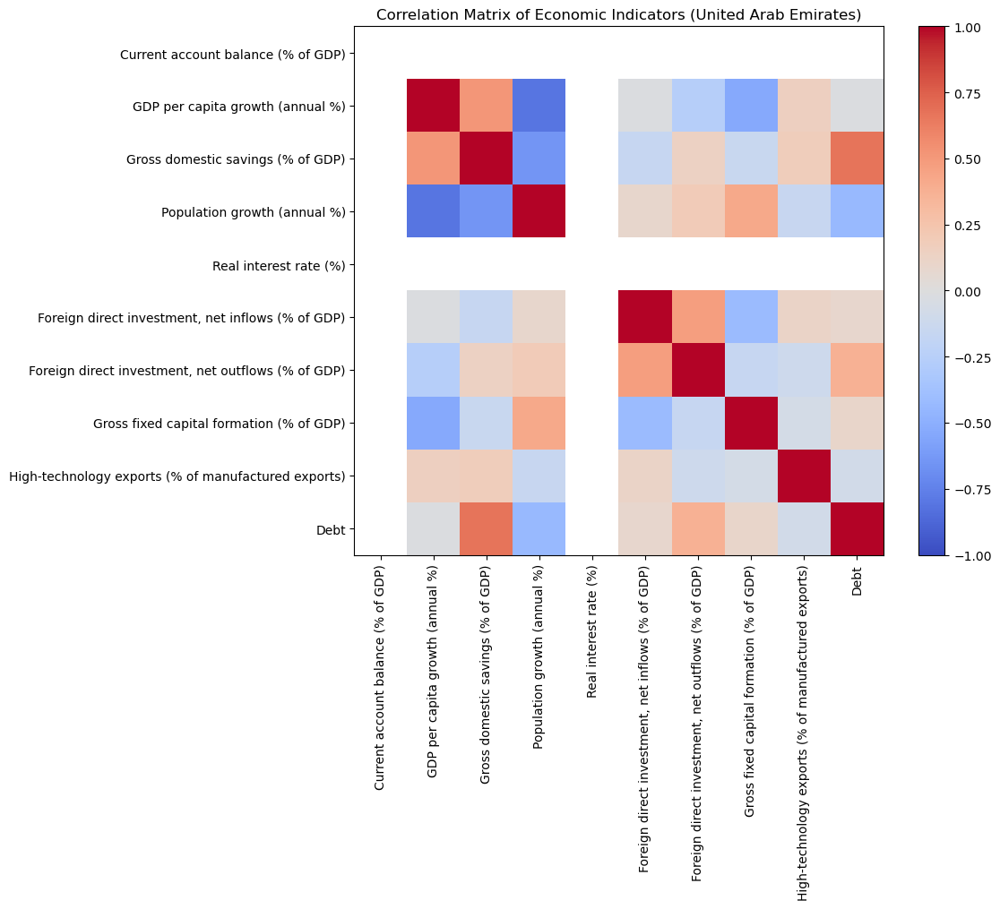

In [58]:
correlation_matrix = Uae.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (United Arab Emirates)")
plt.tight_layout()
plt.show()

***Making a better correlation analysis plot***

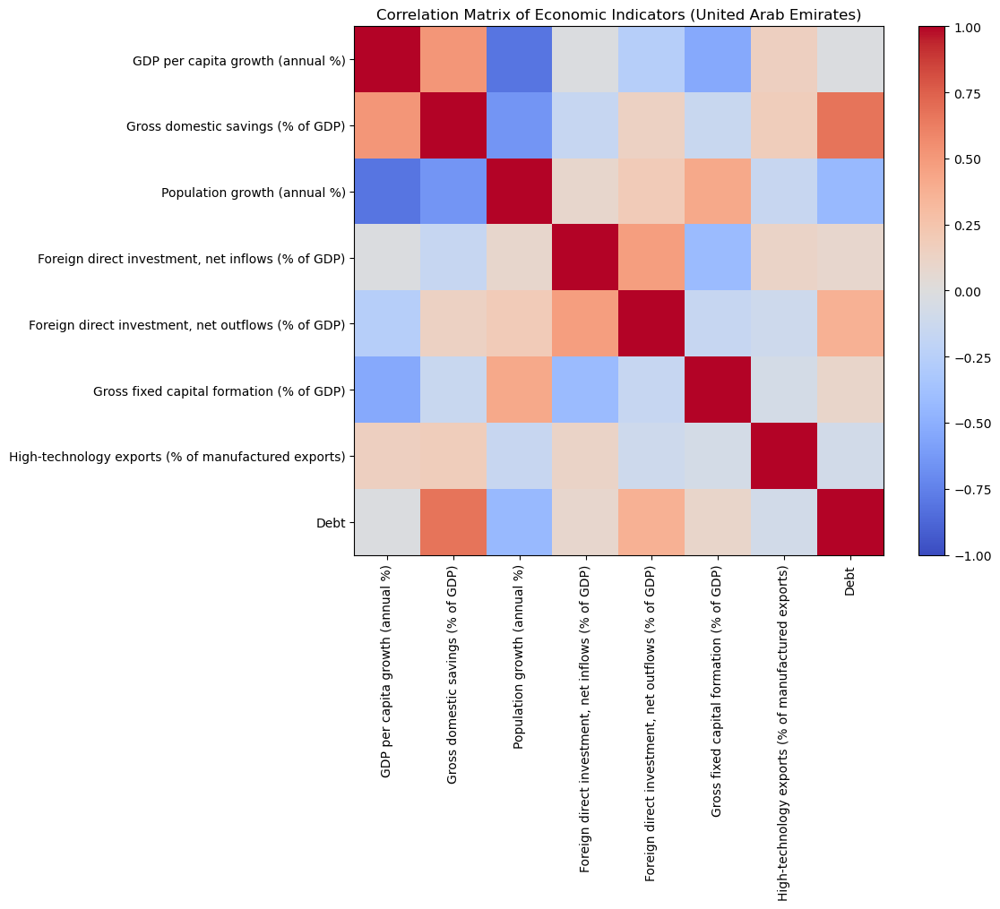

In [59]:
Uae_config = Uae
Uae_remains = Uae
Uae_config.drop(columns=["Current account balance (% of GDP)", "Real interest rate (%)"], inplace=True)
Uae = Uae_config
correlation_matrix = Uae.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (United Arab Emirates)")
plt.tight_layout()
plt.show()
Uae = Uae_remains

- GDP per capita growth & Gross domestic savings: There's a strong positive correlation, suggesting that years with higher GDP per capita growth tend to witness higher domestic savings as a percentage of GDP.

- GDP per capita growth & Gross fixed capital formation: A positive correlation here indicates that years with higher GDP growth also tend to have higher capital formation as a percentage of GDP.

- Population growth & Gross domestic savings: These metrics exhibit a strong negative correlation, implying that years with higher population growth rates might see a decrease in savings rates as a percentage of GDP.

- Gross domestic savings & Foreign direct investment, net inflows: A moderate negative correlation suggests that in years with higher savings rates, there might be lower FDI net inflows as a percentage of GDP.

- Foreign direct investment, net inflows & Foreign direct investment, net outflows: These two metrics show a strong positive correlation, suggesting that in years with higher FDI net inflows, there are also higher FDI net outflows, reflecting the UAE's dynamic investment landscape.

- Debt & Foreign direct investment, net inflows: A noticeable negative correlation indicates that years with higher debt levels might witness lower FDI net inflows as a percentage of GDP.

## United Kingdom

In [60]:
# Convert columns of type 'object' to 'float'
for col in Uk.columns:
    if Uk[col].dtype == 'object':
        Uk[col] = pd.to_numeric(Uk[col], errors='coerce')

In [61]:
Uk.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,15.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,-3.252036,0.569051,14.238004,0.636968,0.858611,4.254793,3.773301,17.196687,22.470068,65.323470
std,1.186776,3.229269,1.550814,0.152893,1.950249,3.595945,5.300316,0.855071,1.095748,23.492491
min,-5.540469,-11.355676,11.700767,0.357301,-1.635770,-0.870539,-3.716380,15.637921,20.451608,35.083619
25%,-3.987796,1.032741,12.697807,0.564131,-0.941212,1.727454,-0.164343,16.518549,22.224021,40.973782
50%,-3.164430,1.412230,14.069882,0.686611,1.306056,3.401996,3.031560,17.513537,22.801942,75.688859
75%,-2.036391,1.764903,15.435264,0.757874,1.710167,6.773851,6.283779,17.763948,23.288317,85.468823
max,-1.803902,3.721393,16.466593,0.792368,4.591683,12.031636,17.529302,18.139787,23.574383,103.596246


The consistently negative Current account balance indicates that the UK has been running trade deficits for the period under consideration.
The GDP per capita growth showcases periods of economic growth, but the minimum value indicates a significant contraction, likely due to the 2008 financial crisis or the economic impacts of the pandemic.
The Gross savings rate, although not extremely high, is consistent, suggesting a steady saving behavior in the UK.
The Population growth rate, while not robust, indicates steady population growth, possibly due to immigration.
The varying levels of Foreign direct investment (both inflows and outflows) highlight the UK's active role in global investment dynamics.
The increasing Debt as a percentage of GDP, especially reaching over 100%, indicates rising public debt, possibly due to economic stimuli or other fiscal measures.

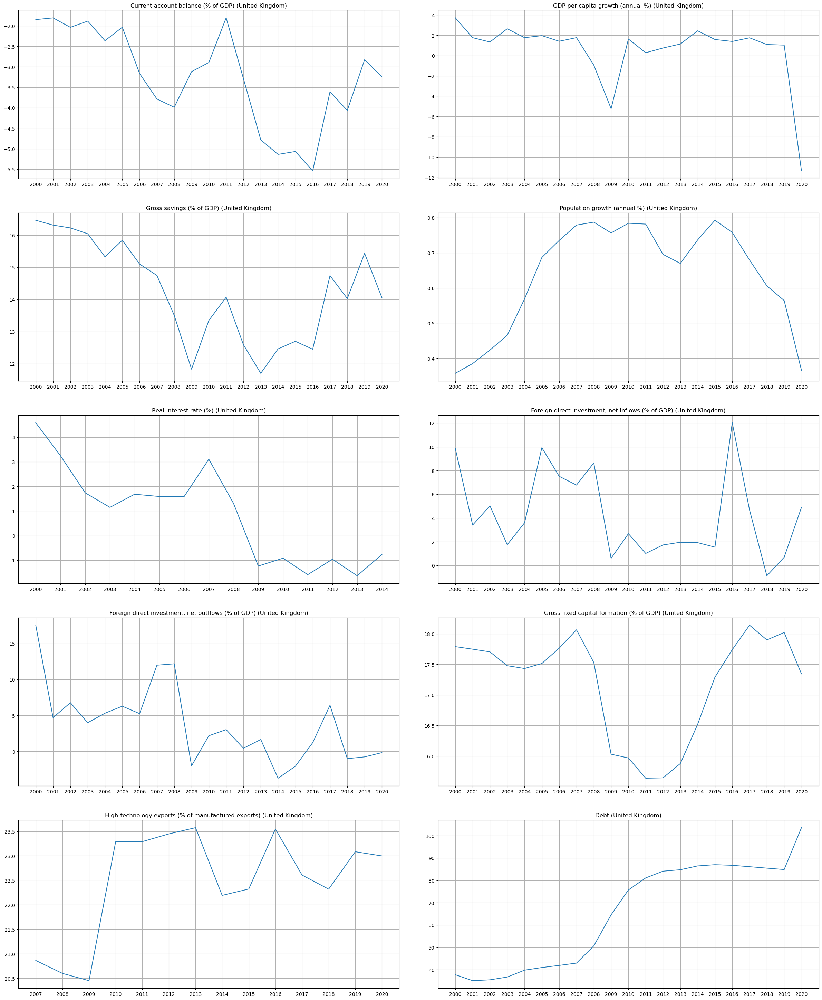

In [62]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Uk.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Uk[columns[i]])
        ax.set_title(f"{columns[i]} (United Kingdom)")
        ax.grid(True)

plt.show()


The persistent trade deficit (Current account balance) highlights the UK's dependence on imports over exports.
The fluctuations in the GDP per capita growth plot offer insights into the UK's economic health and its response to global crises.
The stable Gross savings and Gross fixed capital formation plots suggest a consistent savings behavior and investment pattern.
The increasing Debt plot indicates the UK's growing public debt scenario, especially post-2009.

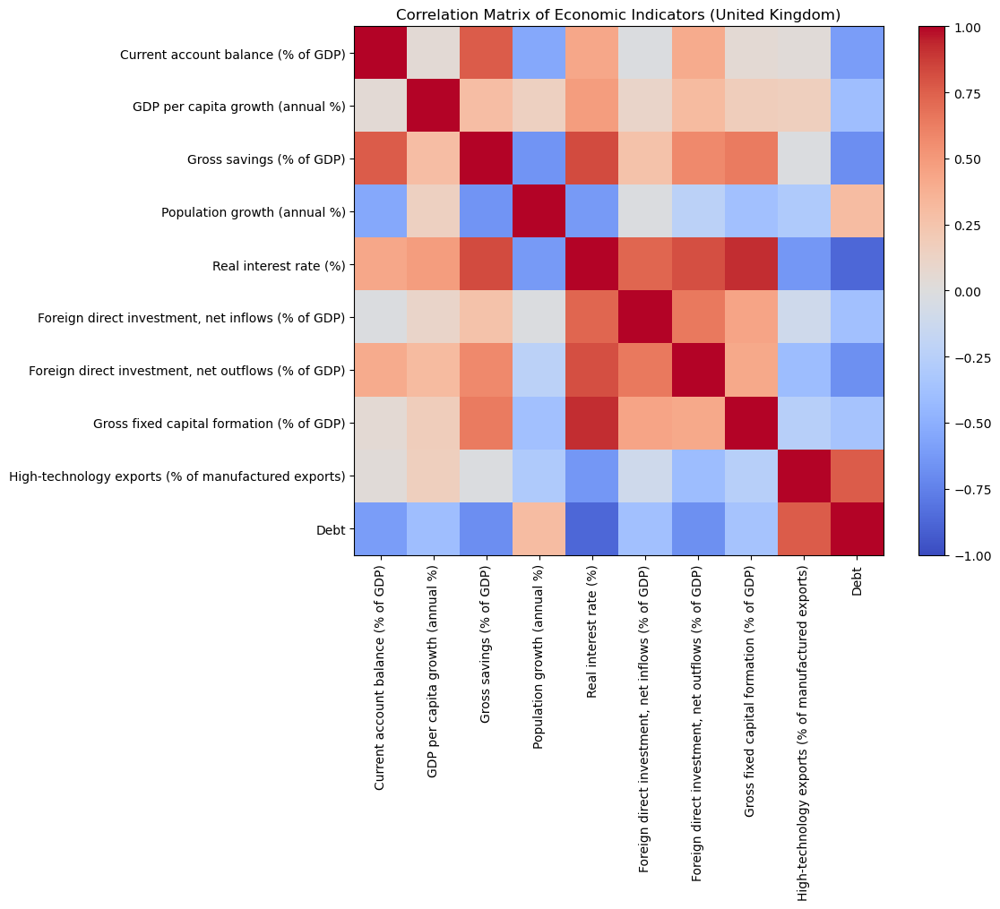

In [63]:
correlation_matrix = Uk.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (United Kingdom)")
plt.tight_layout()
plt.show()

***Making a better correlation analysis plot***

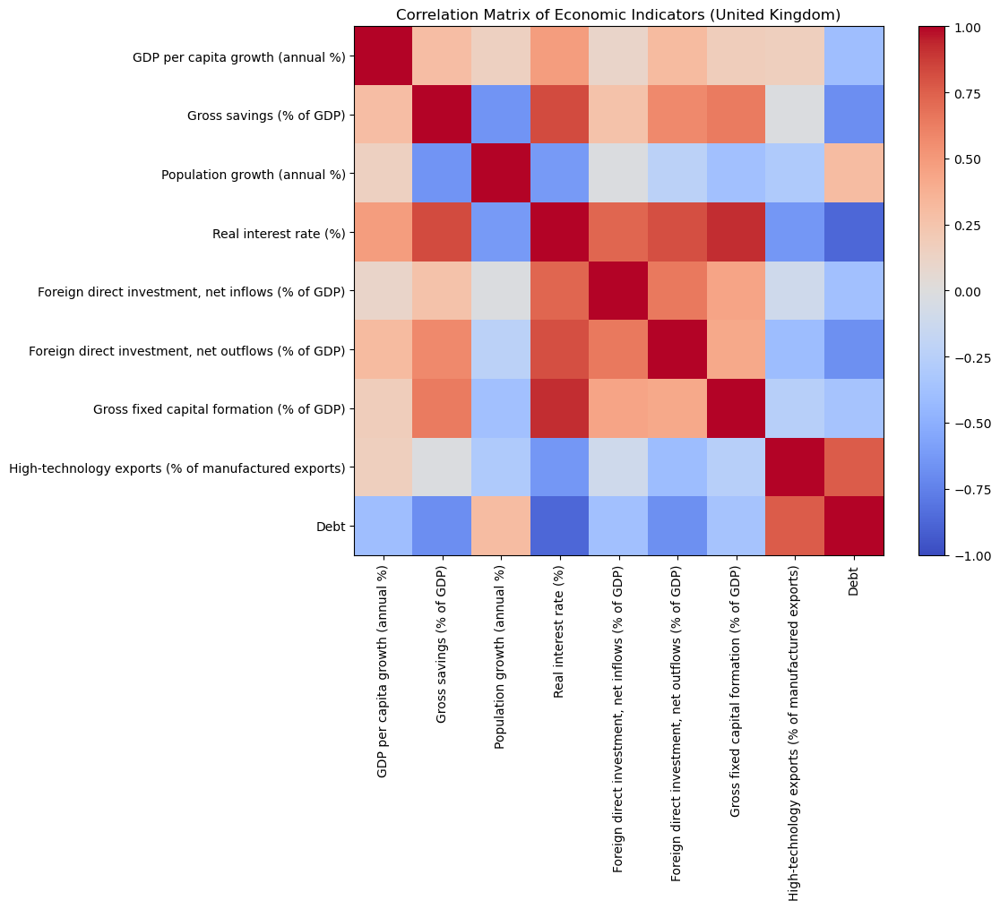

In [64]:
Uk_config = Uk
Uk_remains  = Uk
Uk_config.drop(columns=["Current account balance (% of GDP)"], inplace=True)
Uk = Uk_config
correlation_matrix = Uk.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (United Kingdom)")
plt.tight_layout()
plt.show()
Uk = Uk_remains

- GDP per capita growth & Gross domestic savings: These indicators display a positive correlation, suggesting that during years with a robust GDP per capita growth, the UK also witnesses a favorable saving rate.

- GDP per capita growth & Gross fixed capital formation: A positive correlation suggests that in years with stronger GDP growth, there's also an increase in capital formation as a percentage of GDP.

- Population growth & Gross domestic savings: These two metrics have a negative correlation, implying that in years with higher population growth rates, the saving rate might decrease.

- Real interest rate & Gross domestic savings: A negative correlation suggests that in years with higher real interest rates, the saving rate tends to decrease.

- Current account balance & Foreign direct investment, net inflows: A negative correlation between these metrics indicates that years with a higher trade deficit (negative current account balance) might experience higher FDI net inflows.

- Debt & GDP per capita growth: A negative correlation implies that years with increased debt levels might witness slower GDP growth rates.

- Gross savings & Foreign direct investment, net inflows: A negative correlation suggests that in years with higher saving rates, there might be lower FDI net inflows.

## United States

In [65]:
for col in Us.columns:
    if Us[col].dtype == 'object':
        Us[col] = pd.to_numeric(Us[col], errors='coerce')

In [66]:
Us.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,14.000000,21.000000
mean,-3.406591,1.022073,18.307263,0.820511,2.813061,1.740372,1.841004,20.980262,21.881540,86.505846
std,1.346131,1.771684,1.876754,0.163905,1.446066,0.676478,0.936605,1.432007,3.482405,24.017097
min,-5.911019,-3.700953,13.821771,0.455381,1.148425,0.707069,-0.636632,18.313945,18.474054,53.146247
25%,-4.558981,0.814519,17.391246,0.726787,2.023885,1.112600,1.603708,20.299954,19.653711,64.562495
50%,-2.918621,1.540381,18.993763,0.859482,2.441415,1.689113,2.054209,20.978794,20.540089,95.143443
75%,-2.142160,1.916480,19.629340,0.945865,3.109921,2.160335,2.324598,22.127742,22.557837,105.116087
max,-1.853529,2.925441,20.798418,1.112769,6.813424,3.405783,3.619468,23.146289,29.879568,134.506041


The US has consistently run a trade deficit (Current account balance) over the period, reflecting its consumption-driven economy and dependence on imports.
The GDP per capita growth exhibits fluctuations, indicating the economic challenges and recoveries the US has experienced over the two decades.
The Gross savings rate, while not extremely high, has been fairly consistent.
The Population growth rate is steady, reflecting both natural growth and immigration patterns.
The varying levels of Foreign direct investment (both inflows and outflows) highlight the active role the US plays in the global investment landscape.
The sharp increase in Debt as a percentage of GDP, especially crossing 100%, indicates rising public debt, possibly due to economic stimuli, wars, or other fiscal measures.

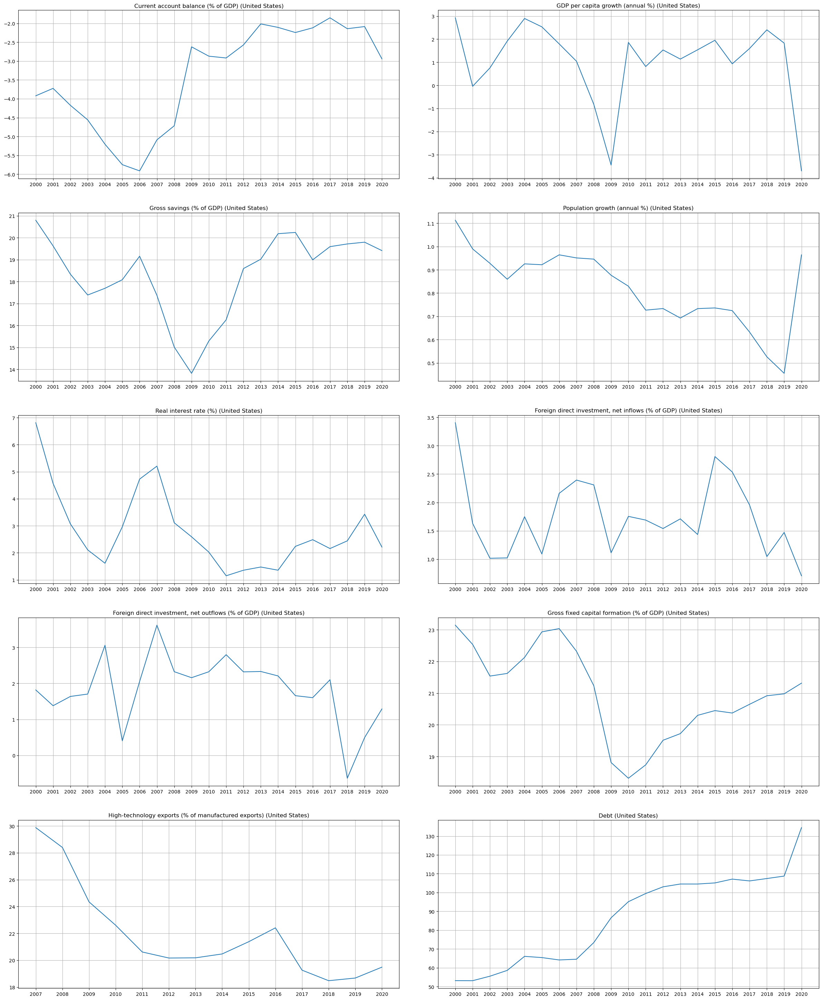

In [67]:
fig, axs = plt.subplots(5, 2, figsize=(25, 30))
fig.tight_layout(pad=5.0)

columns = Us.columns

for i, ax in enumerate(axs.ravel()):
    if i < len(columns):
        ax.plot(Us[columns[i]])
        ax.set_title(f"{columns[i]} (United States)")
        ax.grid(True)

plt.show()


The persistent trade deficit (Current account balance) underscores the US's consumption-driven economy and its reliance on imports.
The fluctuations in the GDP per capita growth plot offer insights into the country's economic health and its responses to global challenges.
The steady Gross savings and Gross fixed capital formation plots suggest consistent savings behavior and investment patterns.
The sharply increasing Debt plot signals the nation's rising debt scenario, especially after 2008.

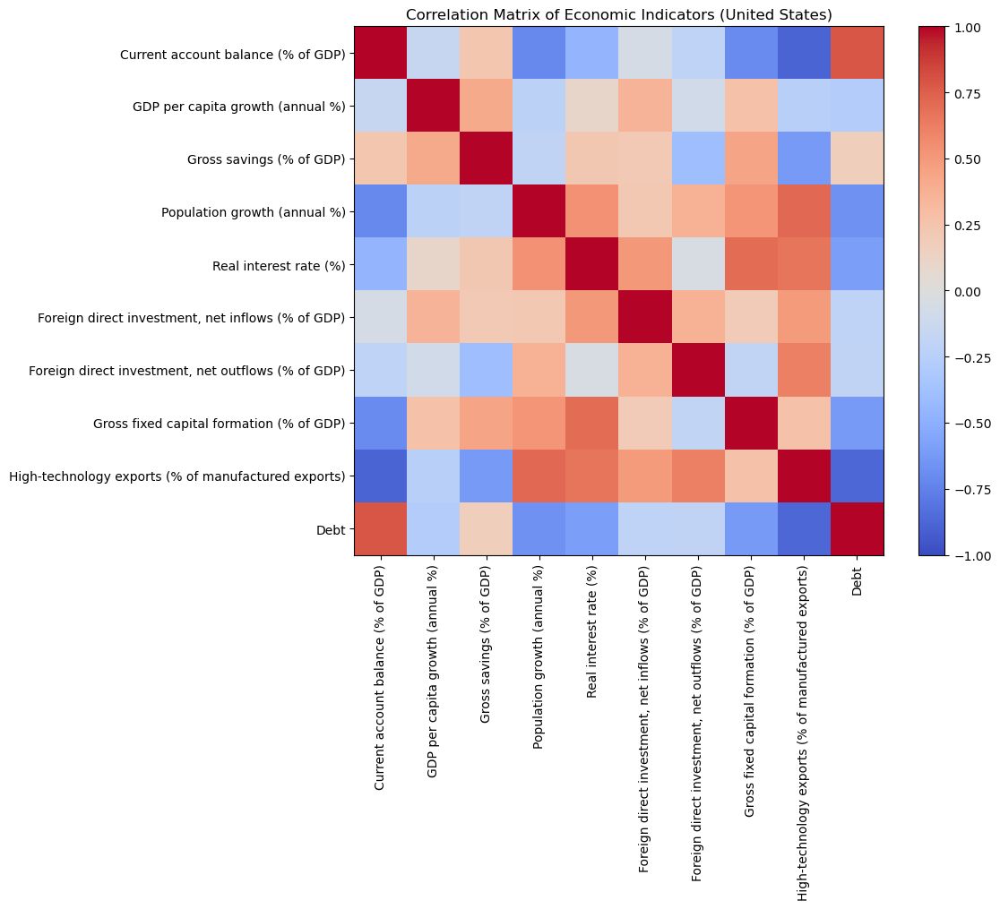

In [68]:
# Correlation matrix
correlation_matrix = Us.corr()

plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar()
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Economic Indicators (United States)")
plt.tight_layout()
plt.show()

- GDP per capita growth & Gross domestic savings: There's a significant positive correlation between these variables, suggesting that when the GDP per capita growth rate is high, the gross domestic savings rate also tends to be higher.

- Population growth & Gross domestic savings: These variables display a negative correlation, implying that years with higher population growth rates might be associated with lower savings rates.

- Real interest rate & Gross domestic savings: These two metrics have a negative correlation, indicating that in years with higher real interest rates, the gross savings rate might decrease.

- Current account balance & Foreign direct investment, net inflows: There's a negative correlation between these two metrics, suggesting that years with a higher trade deficit (negative current account balance) might be associated with higher FDI net inflows.

- Foreign direct investment, net inflows & outflows: These two metrics display a positive correlation, which is expected as net inflows and outflows usually move in tandem based on global investment dynamics.

- Debt & Gross fixed capital formation: A noticeable negative correlation exists between these variables, indicating that years with increased debt levels might witness a decrease in capital formation as a percentage of GDP.

### All the Countries together

In [69]:
China["Country"] = "China"
Canada["Country"] = "Canada"
France["Country"] = "France"
Germany["Country"] = "Germany"
Italy["Country"] = "Italy"
Korea["Country"] = "Korea"
Russian_Federation["Country"] = "Russian Federation"
Japan["Country"] = "Japan"
Switzerland["Country"] = "Switzerland"
Uae["Country"] = "United Arab Emirates"
Uk["Country"] = "United Kingdom"
Us["Country"] = "United States"

world_data = pd.concat([China, Canada, France, Germany, Italy, Korea, Russian_Federation, Japan, Switzerland, Uae, Uk, Us])
cols = ['Country'] + [col for col in world_data if col != 'Country']
world_data = world_data[cols]

In [70]:
world_data['Gross savings (% of GDP)'] = np.where(
    world_data['Country'] == 'United Arab Emirates',
    world_data['Gross domestic savings (% of GDP)'],
    world_data['Gross savings (% of GDP)']
)

# Drop the column 'Gross domestic savings (% of GDP)' as it's no longer needed
world_data = world_data.drop(columns=['Gross domestic savings (% of GDP)'])

In [71]:
world_data.head()

Series Name,Country,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
2000,China,1.693870,7.638598,35.739554,0.787957,3.710664,3.475126,0.380738,32.577418,NaN,22.986707
2001,China,1.299163,7.551655,37.269297,0.726381,3.726664,3.512989,0.723906,33.453526,NaN,24.574620
2002,China,2.408746,8.404880,38.883221,0.670000,4.679724,3.609081,0.427324,35.058366,NaN,25.915546
2003,China,2.593031,9.354777,42.413504,0.622861,2.638147,3.487419,0.509317,38.257685,NaN,26.800321
2004,China,3.525766,9.461559,45.672367,0.593933,-1.282812,3.483641,0.407733,39.529664,NaN,26.393226


In [72]:
world_data.describe()

Series Name,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt
count,210.000000,252.000000,250.000000,252.000000,203.000000,252.000000,252.000000,251.000000,164.000000,252.000000
mean,2.415928,1.562304,28.048414,0.866925,2.602113,2.319892,2.960697,23.892706,19.312591,67.086753
std,4.130547,3.901397,10.082592,2.116826,2.895868,4.046028,3.630595,6.326173,8.335219,52.131122
min,-5.911019,-17.145394,11.700767,-1.853715,-12.856935,-32.729174,-14.890551,15.637921,2.617915,2.689688
25%,-0.496156,0.323679,20.707529,0.212712,1.588183,0.902117,1.027649,20.032249,14.285986,34.275868
50%,1.943655,1.537880,26.352566,0.575504,2.944664,1.839818,2.248793,21.995135,18.729073,52.697249
75%,4.764748,2.892521,33.861592,0.831258,4.086876,3.022238,3.671614,26.244011,26.316171,88.527923
max,17.474242,13.635821,59.219237,18.127984,13.079965,24.248074,26.624250,44.518766,36.390707,259.432505


### GDP

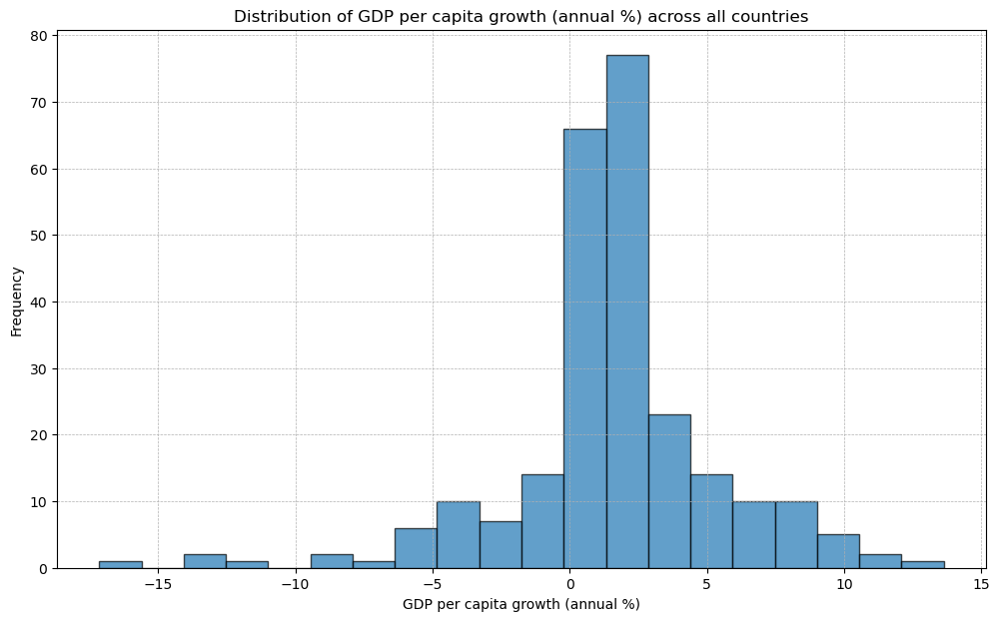

In [73]:
plt.figure(figsize=(12, 7))
plt.hist(world_data['GDP per capita growth (annual %)'].dropna(), bins=20, edgecolor='black', alpha=0.7)
plt.title('Distribution of GDP per capita growth (annual %) across all countries')
plt.xlabel('GDP per capita growth (annual %)')
plt.ylabel('Frequency')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

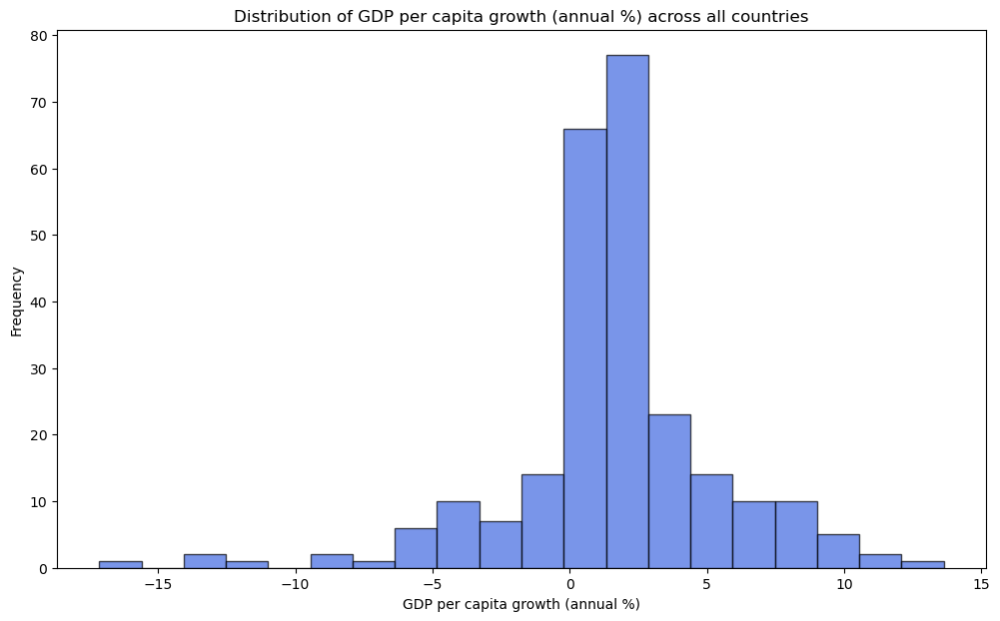

In [74]:
# This way the histogram is prettier but maybe the other histogram is getting easier understood
plt.figure(figsize=(12, 7))
plt.hist(world_data['GDP per capita growth (annual %)'].dropna(), bins=20, edgecolor='black', alpha=0.7, color="royalblue")
plt.title('Distribution of GDP per capita growth (annual %) across all countries')
plt.xlabel('GDP per capita growth (annual %)')
plt.ylabel('Frequency')
plt.grid(False)
plt.show()

- Central Tendency: The majority of the data points fall within the range of 0% to 5%, indicating that most countries typically experience moderate positive growth in GDP per capita.

- Skewness: The distribution is slightly left-skewed, suggesting that there are more instances of countries experiencing negative growth or recessions than those experiencing very high growth rates.

- Outliers: There are a few countries that have experienced extremely high growth rates (above 10%) or very significant declines in GDP per capita growth (below -10%). These could be due to specific economic events or crises in those countries.

- Spread: The wider spread on the positive side (0% to 10%) compared to the negative side suggests that while economic downturns are relatively rare, they tend not to be as severe as the most prosperous years in terms of GDP per capita growth.

- Frequency: The highest frequency is observed in the 1% to 2% range, suggesting that this is a common growth rate for many countries.

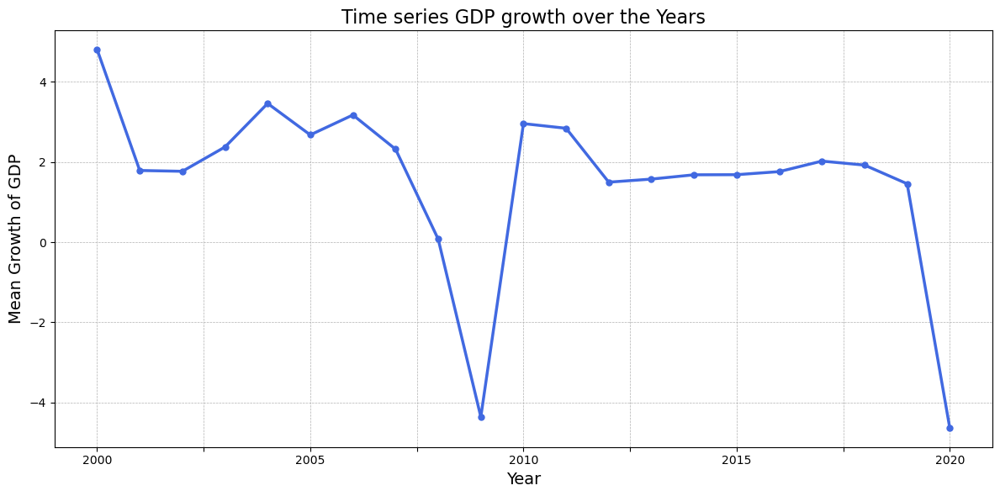

In [75]:
mean_gdp_per_year = world_data.groupby(world_data.index)['GDP per capita growth (annual %)'].mean()

plt.figure(figsize=(12, 6))
mean_gdp_per_year.plot(color='royalblue', linewidth=2.5, marker='o', markersize=5)

plt.title('Time series GDP growth over the Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Mean Growth of GDP', fontsize=14)

plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


- From 2000 to 2007, the global GDP growth fluctuated but was generally positive, with a peak around 2000 and 2004. This indicates that the world economy was growing at a reasonably steady rate during this period.

- In 2008, there's a sharp drop in GDP growth, reaching close to zero. By 2009, the GDP growth rate is significantly negative. This decline corresponds with the global financial crisis of 2008-2009. The negative growth in 2009 indicates a global recession.

- Post the 2009 recession, there's a clear recovery in 2010. The subsequent years up to 2014 show positive GDP growth, though the rate is less robust compared to the early 2000s.

- From 2014 onwards, the GDP growth rate seems to stabilize, maintaining a positive but moderate growth rate. The growth is consistent but not as high as the peaks observed in the early 2000s.

- 2020 witnesses another significant drop in the GDP growth rate, turning it negative. This decline can be attributed to the global impact of the COVID-19 pandemic, which led to economic slowdowns, lockdowns, and disruptions in trade and industries across the world.


***In summary, the GDP growth trend from 2000 to 2020 reflects significant global events that influenced economic growth. The 2008 financial crisis and the 2020 COVID-19 pandemic are clearly evident in the data, showcasing their profound impacts on global economic growth.***

In [76]:
mean_gdp_per_year

2000    4.802937
2001    1.786637
2002    1.765967
2003    2.372659
2004    3.457382
2005    2.673588
2006    3.170440
2007    2.317287
2008    0.076102
2009   -4.356540
2010    2.954650
2011    2.838784
2012    1.495448
2013    1.571785
2014    1.679080
2015    1.681712
2016    1.758403
2017    2.020414
2018    1.920919
2019    1.455334
2020   -4.634595
Name: GDP per capita growth (annual %), dtype: float64

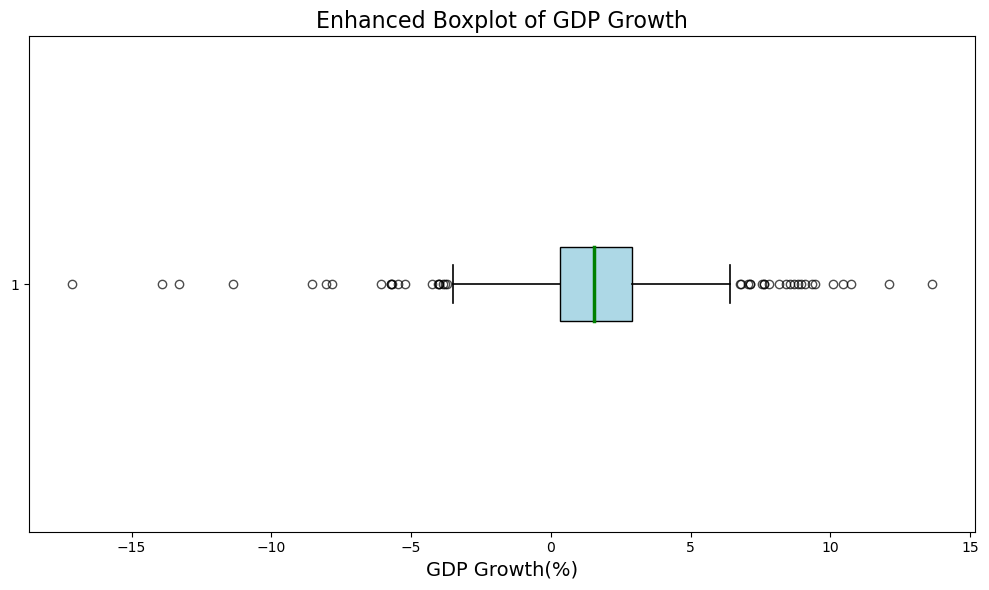

In [77]:
plt.figure(figsize=(10, 6))
bp = plt.boxplot(world_data['GDP per capita growth (annual %)'].dropna(), vert=False, patch_artist=True)
colors = ['lightblue']

for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_edgecolor('black')
    
for whisker in bp['whiskers']:
    whisker.set(color='black', linewidth=1.2, linestyle='-')

for cap in bp['caps']:
    cap.set(color='black', linewidth=1.2)

for median in bp['medians']:
    median.set(color='green', linewidth=2.5)

for flier in bp['fliers']:
    flier.set(marker='o', color='black', alpha=0.7)

plt.title('Enhanced Boxplot of GDP Growth', fontsize=16)
plt.xlabel('GDP Growth(%)', fontsize=14)

plt.tight_layout()
plt.show()

### DEBT

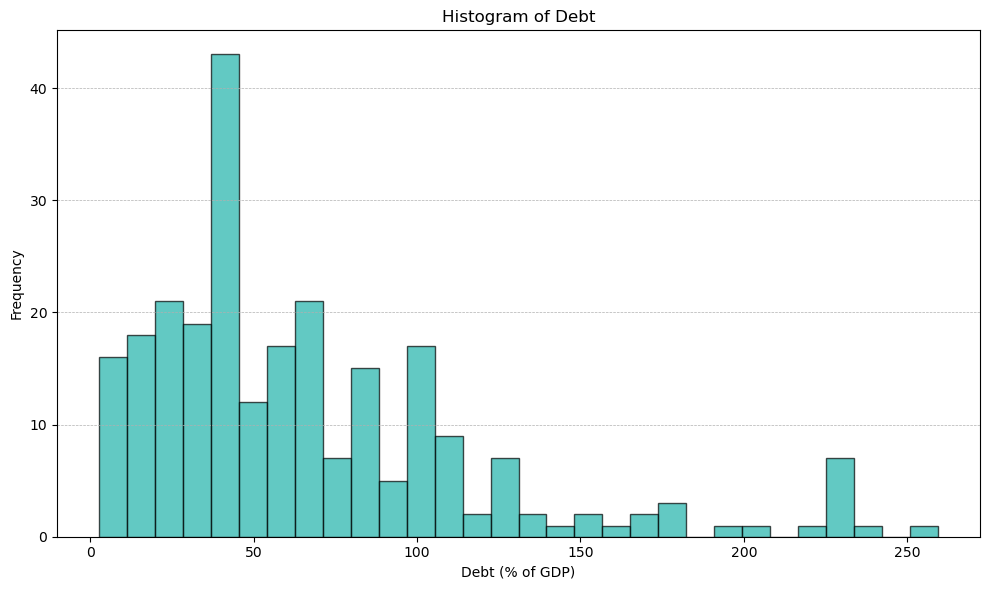

In [78]:
plt.figure(figsize=(10, 6))
plt.hist(world_data['Debt'], bins=30, color='lightseagreen', edgecolor='black', alpha=0.7)
plt.title('Histogram of Debt')
plt.xlabel('Debt (% of GDP)')
plt.ylabel('Frequency')
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

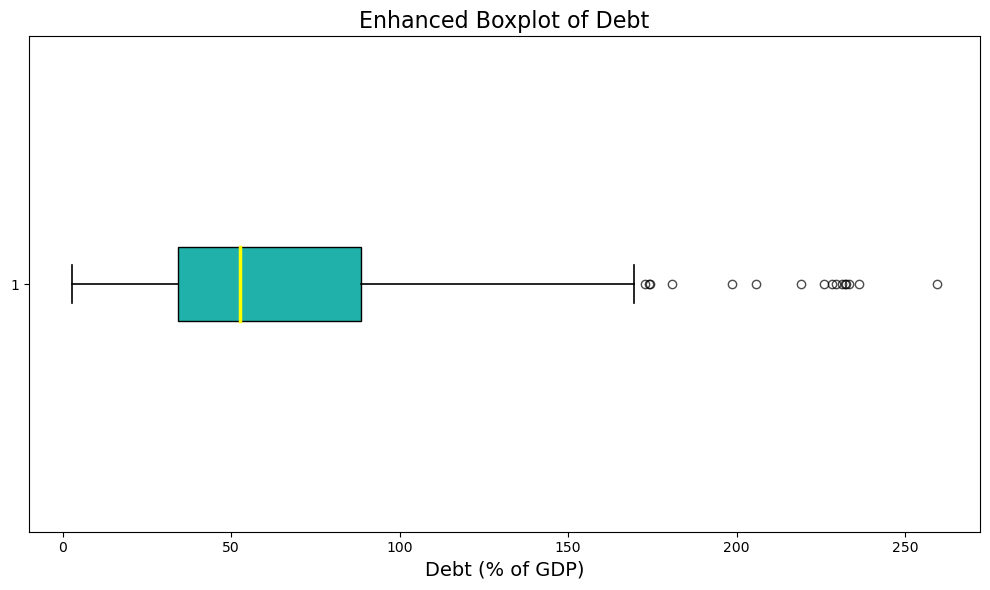

In [79]:
plt.figure(figsize=(10, 6))
bp = plt.boxplot(world_data['Debt'].dropna(), vert=False, patch_artist=True)
colors = ['lightseagreen']

for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_edgecolor('black')
    
for whisker in bp['whiskers']:
    whisker.set(color='black', linewidth=1.2, linestyle='-')

for cap in bp['caps']:
    cap.set(color='black', linewidth=1.2)

for median in bp['medians']:
    median.set(color='yellow', linewidth=2.5)

for flier in bp['fliers']:
    flier.set(marker='o', color='black', alpha=0.7)

plt.title('Enhanced Boxplot of Debt', fontsize=16)
plt.xlabel('Debt (% of GDP)', fontsize=14)

plt.tight_layout()
plt.show()

The yellow line in the middle of the box represents the median of the debt distribution. This is the middle value when all debt values are sorted in ascending order. The position of the median towards the left side of the box indicates that more than half of the data points (or countries/years) have a debt below 60% of GDP, approximately.
Interquartile Range (IQR):

The width of the box represents the interquartile range (IQR), which is the range between the first quartile (25th percentile) and the third quartile (75th percentile). It gives an idea of the spread of the middle 50% of the data. In this case, the IQR is relatively wide, indicating variability in debt levels for the middle 50% of countries/years.
Whiskers:

The "whiskers" or the lines extending out from the box show the range of the data, excluding potential outliers. Data points outside the whiskers are generally considered as outliers.
The left whisker extends to the minimum debt value that is not an outlier, while the right whisker extends to the maximum debt value that is not an outlier.
Outliers:

Outliers are represented as black circles. These are data points that fall outside the "whiskers." Outliers can be due to genuine high debt levels in certain countries/years or data errors.
In this plot, there are several countries/years with high debt levels that are considered outliers.
Overall Distribution:

The boxplot shows that while many countries/years have a debt level between approximately 20% and 100% of GDP, there are several with much higher debt levels, as indicated by the outliers.
The skewed position of the median suggests that a significant number of countries/years have relatively low debt levels (below the median), while a smaller number have very high debt levels.

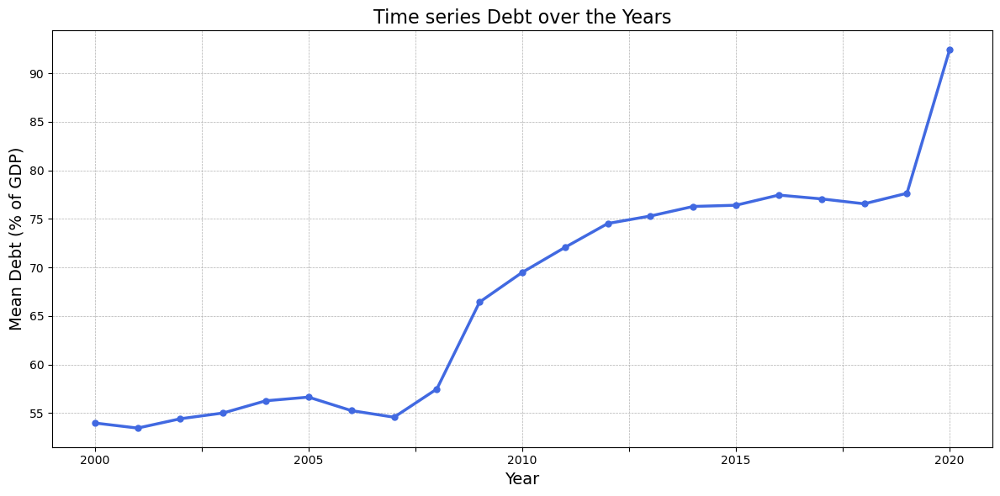

In [80]:
mean_debt_per_year = world_data.groupby(world_data.index)['Debt'].mean()

plt.figure(figsize=(12, 6))
mean_debt_per_year.plot(color='royalblue', linewidth=2.5, marker='o', markersize=5)

plt.title('Time series Debt over the Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Mean Debt (% of GDP)', fontsize=14)

plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

- The debt as a percentage of GDP showed a steady increase from 2000 up until around 2008. The increase was gradual, with minor fluctuations.
- There's a notable spike in debt levels from 2008 to 2009. This coincides with the global financial crisis of 2008-2009, which had significant economic repercussions worldwide. Many countries increased borrowing during this period to stimulate their economies.
- Following the sharp rise, there was a moderate increase in debt levels up until 2014. This suggests that the aftermath of the financial crisis had lingering effects on global economies.
Stabilization (2014-2018):
- From 2014 to 2018, the debt levels seem to stabilize, with minor decreases and increases. This could be due to economic recovery in various countries and efforts to reduce public debt.
- The debt slightly increased from 2018 to 2019, but not as prominently as previous years.
- There's a substantial increase in debt in 2020. This can be attributed to the global COVID-19 pandemic, which severely impacted economies worldwide. Governments increased spending for healthcare, stimulus packages, and other measures, leading to increased borrowing.

***In summary, the debt trend from 2000 to 2020 reflects significant global events that influenced economic policies and borrowing behaviors of countries. The financial crisis of 2008 and the COVID-19 pandemic in 2020 are two major events that are evident in the data due to their profound economic impacts.***

In [81]:
mean_debt_per_year

2000    53.981375
2001    53.459916
2002    54.420544
2003    55.013066
2004    56.272464
2005    56.646968
2006    55.260784
2007    54.579877
2008    57.483449
2009    66.434976
2010    69.498513
2011    72.072547
2012    74.529716
2013    75.301753
2014    76.285543
2015    76.409500
2016    77.455284
2017    77.063891
2018    76.558491
2019    77.642803
2020    92.450355
Name: Debt, dtype: float64

In [82]:
world_data.Debt.describe()

count    252.000000
mean      67.086753
std       52.131122
min        2.689688
25%       34.275868
50%       52.697249
75%       88.527923
max      259.432505
Name: Debt, dtype: float64

In [83]:
world_data.columns

Index(['Country', 'Current account balance (% of GDP)',
       'GDP per capita growth (annual %)', 'Gross savings (% of GDP)',
       'Population growth (annual %)', 'Real interest rate (%)',
       'Foreign direct investment, net inflows (% of GDP)',
       'Foreign direct investment, net outflows (% of GDP)',
       'Gross fixed capital formation (% of GDP)',
       'High-technology exports (% of manufactured exports)', 'Debt'],
      dtype='object', name='Series Name')

### Rest Indicators

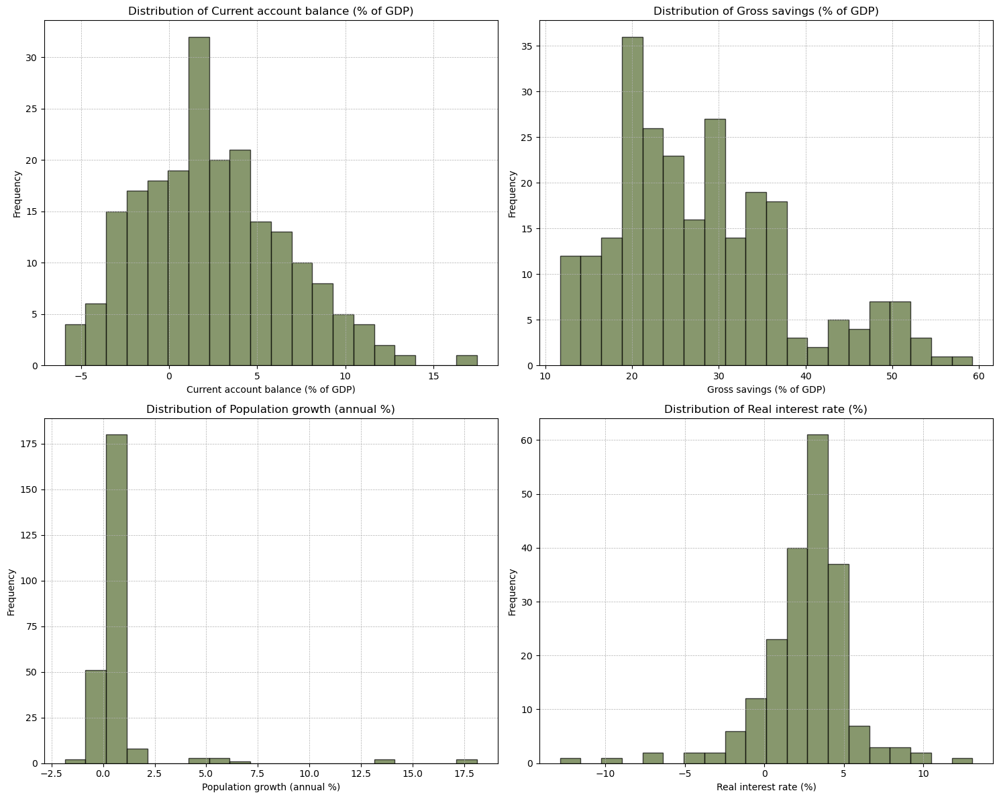

In [84]:
key_indicators = [
    'Current account balance (% of GDP)',
    'Gross savings (% of GDP)', 
    'Population growth (annual %)', 
    'Real interest rate (%)',
]

plt.figure(figsize=(15, 12))

for i, indicator in enumerate(key_indicators, 1):
    plt.subplot(2, 2, i)
    plt.hist(world_data[indicator].dropna(), bins=20, edgecolor='black', alpha=0.7, color="darkolivegreen")
    plt.title(f'Distribution of {indicator}')
    plt.xlabel(indicator)
    plt.ylabel('Frequency')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

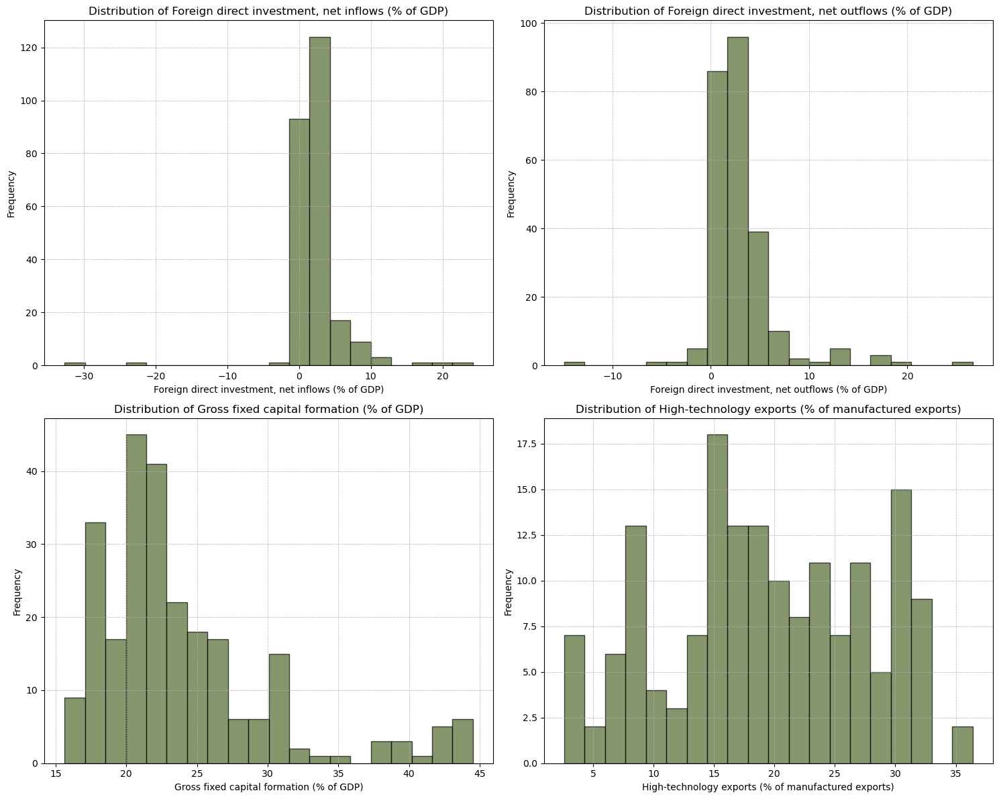

In [85]:
key_indicators_1 = ['Foreign direct investment, net inflows (% of GDP)',
    'Foreign direct investment, net outflows (% of GDP)',
    'Gross fixed capital formation (% of GDP)',
    'High-technology exports (% of manufactured exports)']

plt.figure(figsize=(15, 12))

for i, indicator in enumerate(key_indicators_1, 1):
    plt.subplot(2, 2, i)
    plt.hist(world_data[indicator].dropna(), bins=20, edgecolor='black', alpha=0.7, color="darkolivegreen")
    plt.title(f'Distribution of {indicator}')
    plt.xlabel(indicator)
    plt.ylabel('Frequency')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

In [86]:
world_data.replace("Russian Federation", "Russia", inplace=True)
world_data.replace("United Arab Emirates", "UAE", inplace=True)
world_data.replace("United Kingdom", "UK", inplace=True)
world_data.replace("United States", "USA", inplace=True)

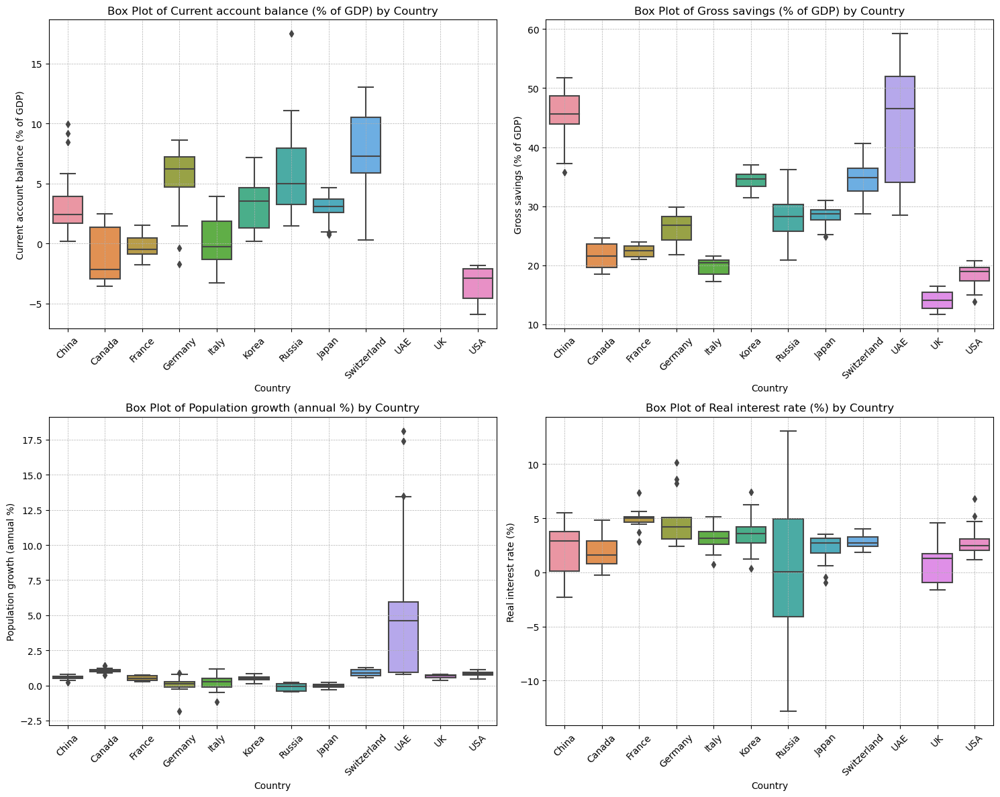

In [87]:
plt.figure(figsize=(15, 12))
for i, indicator in enumerate(key_indicators, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=world_data["Country"], y=world_data[indicator])
    plt.title(f'Box Plot of {indicator} by Country')
    plt.xlabel('Country')
    plt.ylabel(indicator)
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

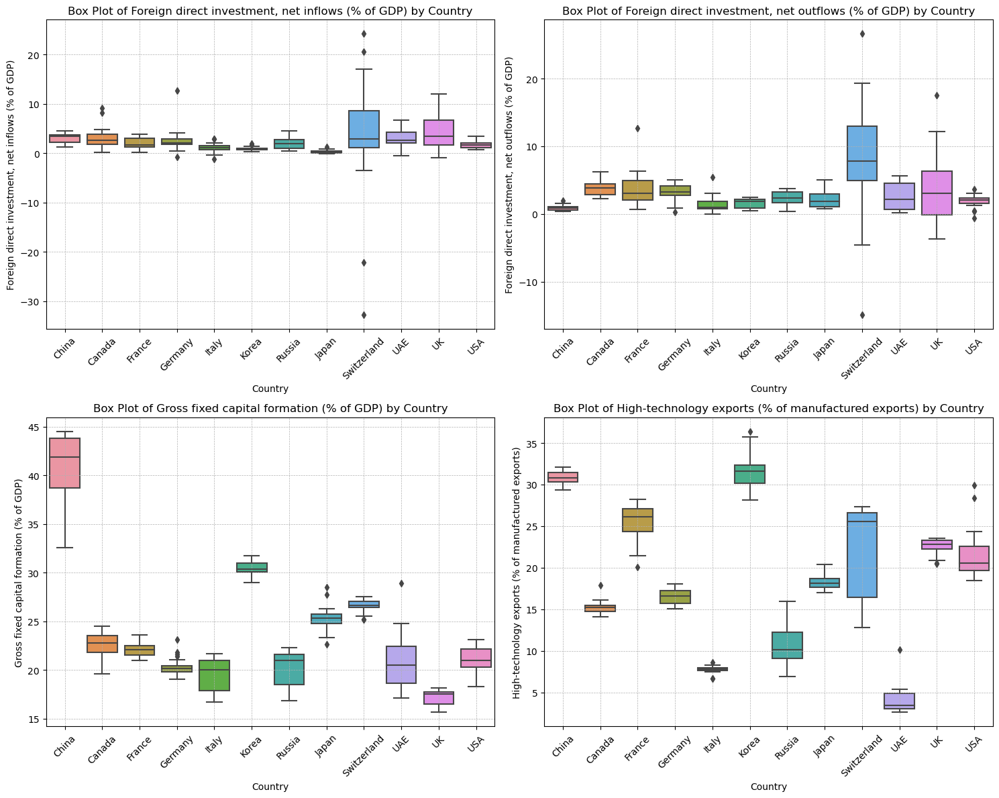

In [88]:
plt.figure(figsize=(15, 12))

for i, indicator in enumerate(key_indicators_1, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=world_data["Country"], y=world_data[indicator])
    plt.title(f'Box Plot of {indicator} by Country')
    plt.xlabel('Country')
    plt.ylabel(indicator)
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

In [89]:
world_data.index.name = "Year"

In [90]:
world_data.replace("Russia", "Russian Federation", inplace=True)
world_data.replace("UAE", "United Arab Emirates", inplace=True)
world_data.replace("UK", "United Kingdom", inplace=True)
world_data.replace("USA", "United States", inplace=True)

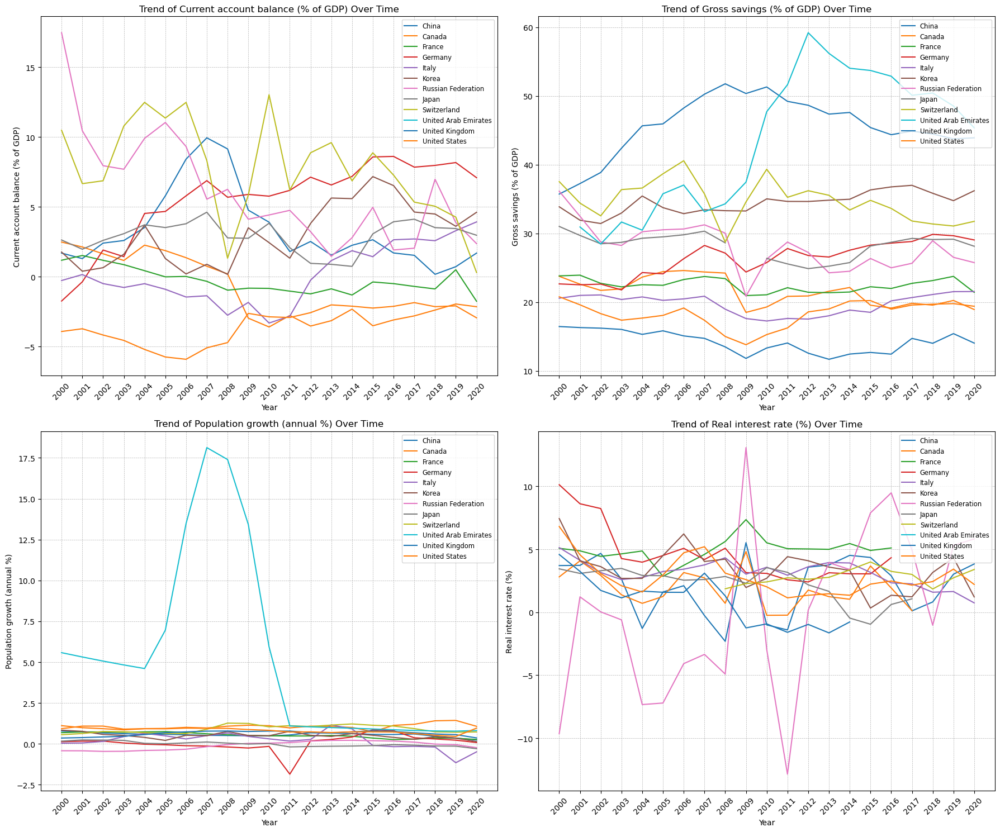

In [91]:
plt.figure(figsize=(18, 15))

for i, indicator in enumerate(key_indicators, 1):
    plt.subplot(2, 2, i)
    for country in world_data['Country'].unique():
        country_data = world_data[world_data['Country'] == country]
        plt.plot(country_data.index, country_data[indicator], label=country)
    plt.title(f'Trend of {indicator} Over Time')
    plt.xlabel('Year')
    plt.ylabel(indicator)
    plt.xticks(ticks=world_data.index.unique(), labels=world_data.index.unique(), rotation=45)
    plt.legend(loc='upper right', fontsize='small')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


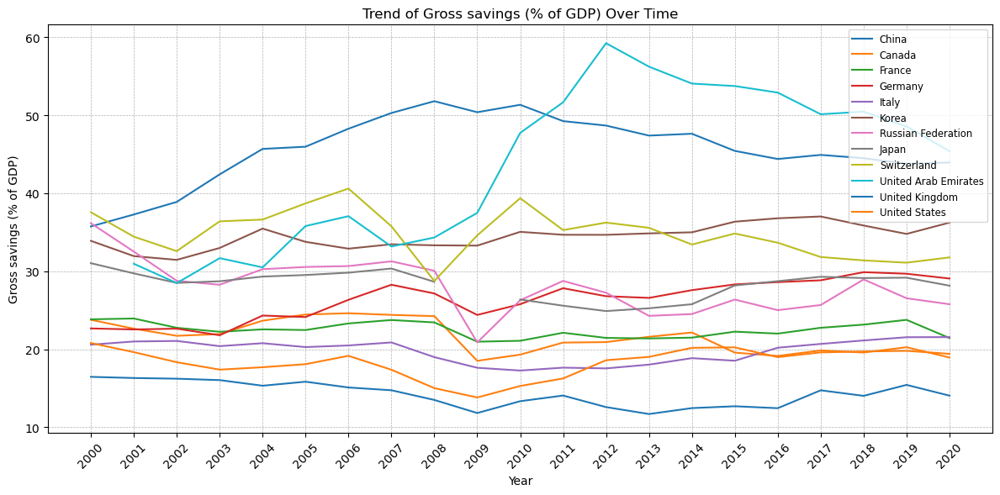

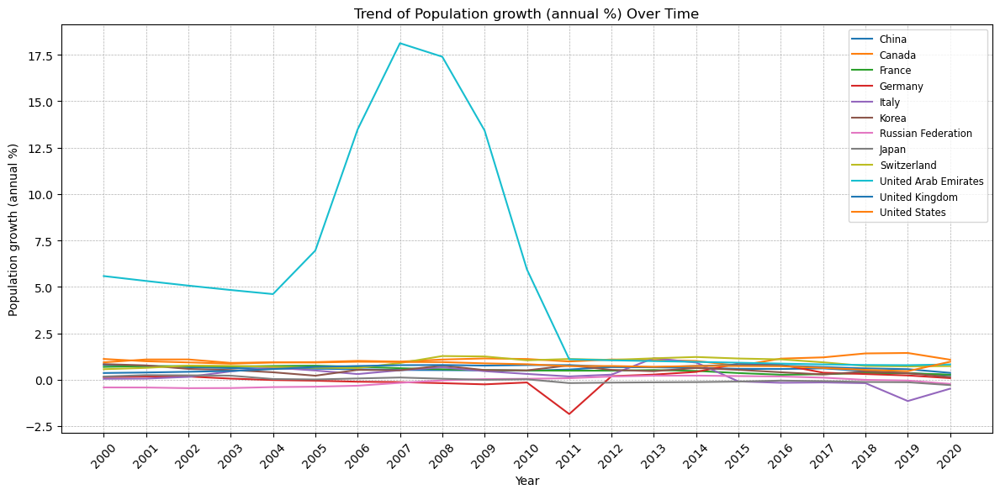

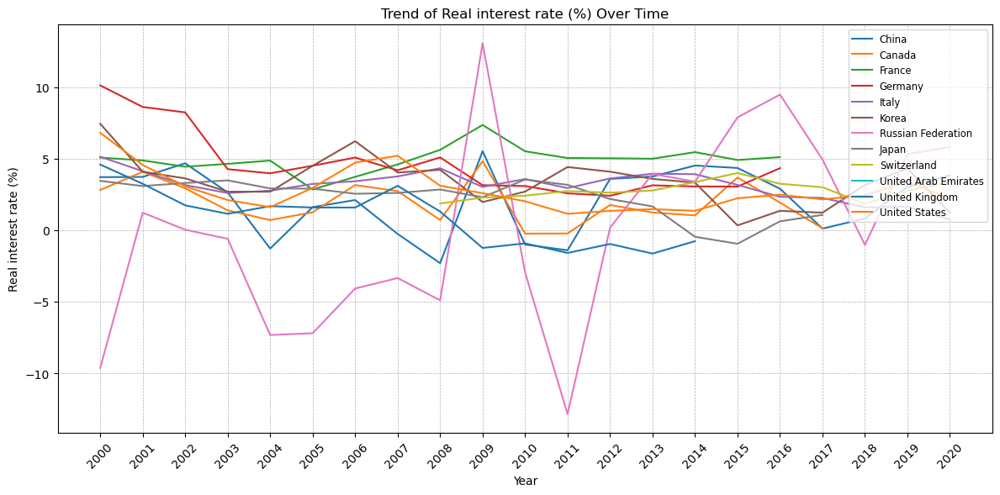

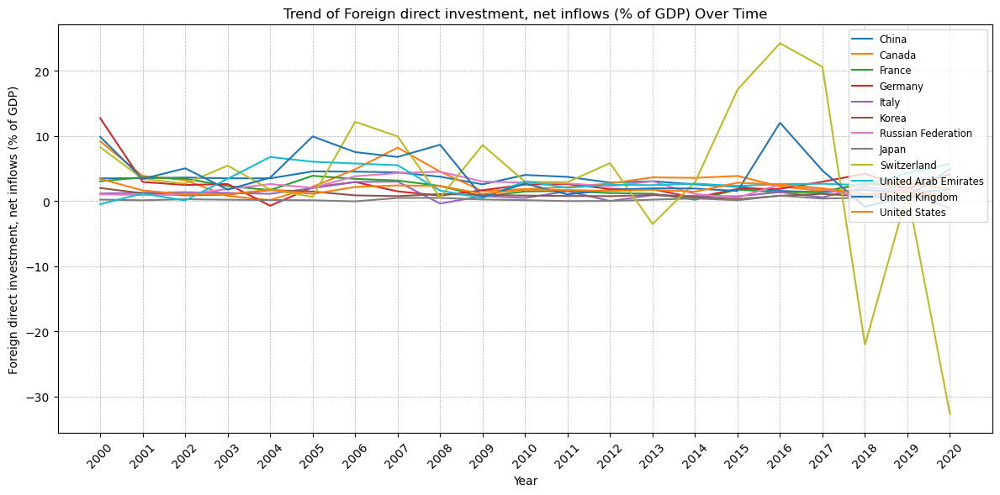

In [92]:
import matplotlib.pyplot as plt

# List of key indicators
key_indicators = [
    'Gross savings (% of GDP)', 
    'Population growth (annual %)', 
    'Real interest rate (%)',
    'Foreign direct investment, net inflows (% of GDP)'
]

for indicator in key_indicators:
    plt.figure(figsize=(12, 6))
    for country in world_data['Country'].unique():
        country_data = world_data[world_data['Country'] == country]
        plt.plot(country_data.index, country_data[indicator], label=country)
    plt.title(f'Trend of {indicator} Over Time')
    plt.xlabel('Year')
    plt.ylabel(indicator)
    plt.xticks(ticks=world_data.index.unique(), labels=world_data.index.unique(), rotation=45)
    plt.legend(loc='upper right', fontsize='small')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


## DEBT AND GDP

/var/folders/9_/cdtvk_7s6k975lf459g3cf0m0000gn/T/ipykernel_4739/2556402522.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_data = world_data.groupby('Year').mean()


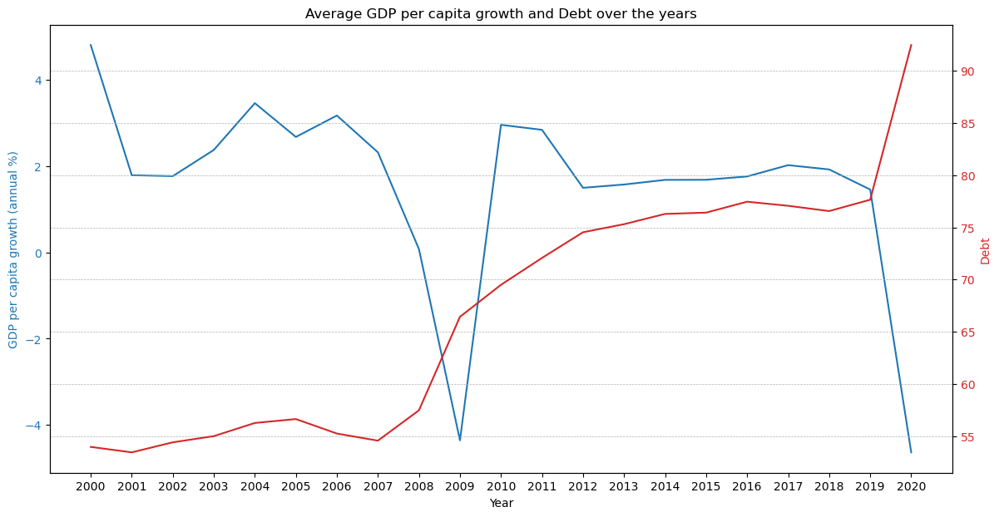

In [93]:
grouped_data = world_data.groupby('Year').mean()

fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:blue'
ax1.set_xlabel('Year')
ax1.set_ylabel('GDP per capita growth (annual %)', color=color)
ax1.plot(grouped_data.index, grouped_data['GDP per capita growth (annual %)'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Debt', color=color)
ax2.plot(grouped_data.index, grouped_data['Debt'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Average GDP per capita growth and Debt over the years')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

# Econometric Analysis

### Scatterplots and Correlation Investigation

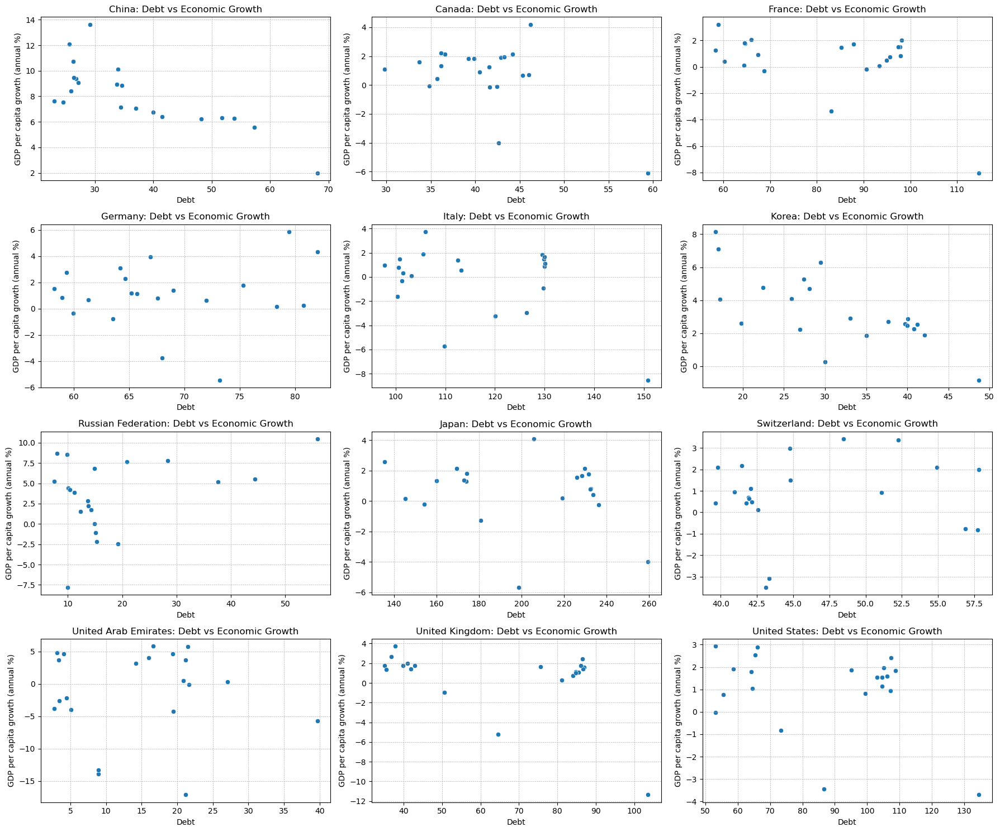

In [94]:
plt.figure(figsize=(18, 15))

for i, country in enumerate(world_data['Country'].unique(), 1):
    plt.subplot(4, 3, i)
    country_data = world_data[world_data['Country'] == country]
    sns.scatterplot(x='Debt', y='GDP per capita growth (annual %)', data=country_data)
    plt.title(f'{country}: Debt vs Economic Growth')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

- For most countries, there doesn't seem to be a clear linear relationship between debt and economic growth.
- Some countries like China, Germany, and the UAE show a wide range of economic growth rates at different debt levels.
- Countries like Russia and the UK seem to have points clustered in specific areas, indicating periods of stable debt and growth rates.

In [95]:
world_data['debt_squared'] = world_data['Debt'] ** 2
constant_to_add = abs(world_data['GDP per capita growth (annual %)'].min()) + 1
world_data['log_GDP_growth'] = np.log(world_data['GDP per capita growth (annual %)'] + constant_to_add)
world_data.head()

Series Name,Country,Current account balance (% of GDP),GDP per capita growth (annual %),Gross savings (% of GDP),Population growth (annual %),Real interest rate (%),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Gross fixed capital formation (% of GDP),High-technology exports (% of manufactured exports),Debt,debt_squared,log_GDP_growth
Year,,,,,,,,,,,,,
2000,China,1.693870,7.638598,35.739554,0.787957,3.710664,3.475126,0.380738,32.577418,NaN,22.986707,528.388706,3.249754
2001,China,1.299163,7.551655,37.269297,0.726381,3.726664,3.512989,0.723906,33.453526,NaN,24.574620,603.911947,3.246376
2002,China,2.408746,8.404880,38.883221,0.670000,4.679724,3.609081,0.427324,35.058366,NaN,25.915546,671.615534,3.279040
2003,China,2.593031,9.354777,42.413504,0.622861,2.638147,3.487419,0.509317,38.257685,NaN,26.800321,718.257183,3.314192
2004,China,3.525766,9.461559,45.672367,0.593933,-1.282812,3.483641,0.407733,39.529664,NaN,26.393226,696.602372,3.318068


In [96]:
formula = '''Q("GDP per capita growth (annual %)") ~ Q("log_GDP_growth") + debt_squared
            + Debt
            + Q("Current account balance (% of GDP)") 
            + Q("Gross savings (% of GDP)") 
            + Q("Population growth (annual %)") 
            + Q("Real interest rate (%)") 
            + Q("Foreign direct investment, net inflows (% of GDP)") 
            + Q("Foreign direct investment, net outflows (% of GDP)") 
            + Q("Gross fixed capital formation (% of GDP)") 
            + Q("High-technology exports (% of manufactured exports)") 
            + C(Country)'''

model = smf.ols(formula=formula, data=world_data).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      OLS Regression Results                                     
=================================================================================================
Dep. Variable:     Q("GDP per capita growth (annual %)")   R-squared:                       0.989
Model:                                               OLS   Adj. R-squared:                  0.987
Method:                                    Least Squares   F-statistic:                     459.4
Date:                                   Mon, 04 Sep 2023   Prob (F-statistic):           2.95e-91
Time:                                           00:25:29   Log-Likelihood:                -45.140
No. Observations:                                    124   AIC:                             132.3
Df Residuals:                                        103   BIC:                             191.5
Df Model:                                             20                                         
Covariance Type:                               nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                  -43.2596      1.471    -29.418      0.000     -46.176     -40.343
C(Country)[T.China]                                          2.5764      0.898      2.868      0.005       0.795       4.358
C(Country)[T.France]                                         0.8584      0.306      2.808      0.006       0.252       1.465
C(Country)[T.Germany]                                        0.0109      0.305      0.036      0.971      -0.593       0.615
C(Country)[T.Italy]                                          0.8669      0.384      2.255      0.026       0.105       1.629
C(Country)[T.Japan]                                          1.2124      0.653      1.857      0.066      -0.082       2.507
C(Country)[T.Korea]                                          0.1994      0.469      0.425      0.672      -0.731       1.130
C(Country)[T.Russian Federation]                            -1.4920      0.310     -4.817      0.000      -2.106      -0.878
C(Country)[T.Switzerland]                                   -0.1754      0.340     -0.516      0.607      -0.849       0.499
C(Country)[T.United Arab Emirates]                       -1.051e-13   3.84e-15    -27.389      0.000   -1.13e-13   -9.75e-14
C(Country)[T.United Kingdom]                              3.742e-14    1.6e-15     23.448      0.000    3.43e-14    4.06e-14
C(Country)[T.United States]                                  1.1249      0.316      3.556      0.001       0.497       1.752
Q("log_GDP_growth")                                         16.2641      0.320     50.890      0.000      15.630      16.898
debt_squared                                                 0.0001   2.69e-05      4.244      0.000    6.08e-05       0.000
Debt                                                        -0.0396      0.008     -5.235      0.000      -0.055      -0.025
Q("Current account balance (% of GDP)")                      0.0052      0.040      0.129      0.897      -0.074       0.084
Q("Gross savings (% of GDP)")                                0.0510      0.036      1.407      0.163      -0.021       0.123
Q("Population growth (annual %)")                           -0.3926      0.121     -3.245      0.002      -0.632      -0.153
Q("Real interest rate (%)")                                 -0.0201      0.017     -1.210      0.229      -0.053       0.013
Q("Foreign direct investment, net inflows (% of GDP)")       0.0167      0.014      1.155      0.251      -0.012       0.045

The regression analysis examines the impact of government debt on economic growth, focusing on two key variables. The first, named "Debt", represents the actual government debt as a percentage of GDP. The second, "debt_squared", captures the squared value of the government debt, aiming to identify non-linear effects of debt on growth.

From the regression results, the coefficient of the "Debt" variable stands at 
−
0.0396
−0.0396. This suggests that for every one percentage point increase in government debt as a percentage of GDP, the GDP per capita growth rate decreases by approximately 0.0396 percentage points, keeping all other factors constant. On the other hand, the "debt_squared" variable has a coefficient of 
0.0001
0.0001, indicating a non-linear relationship between government debt and economic growth.

This non-linear relationship paints a nuanced picture. At initial stages, as government debt increases, it exerts a negative impact on economic growth. Such detrimental effects could arise from various factors: higher interest payments that strain public finances, reduced government investment in productive areas, or perhaps waning investor confidence. However, as debt continues to climb, this negative relationship starts to wane. This suggests that after reaching a certain level of debt, additional increments in debt exert a diminishingly negative effect on growth. Various factors could explain this observation. Perhaps countries borrow for highly productive investments, or perhaps international investors maintain confidence in the country's ability to repay, especially if the bulk of the debt is denominated in the country's currency.

Interestingly, the turning point in this relationship—where the negative impact of debt on growth starts to decline—is at approximately 
173.60
%
173.60% of GDP. Up to this threshold, growth tends to decline as debt increases. Beyond this point, the growth-debt relationship becomes less straightforward, with the detrimental impact of rising debt on growth starting to diminish.

In conclusion, while increasing government debt is typically linked with decreasing economic growth, this relationship becomes more complex as debt levels escalate, particularly beyond the threshold of 
173.60
%
173.60% of GDP. It's pivotal to underscore that while the regression analysis presents an association between debt and growth, it doesn't firmly establish causation. Numerous external factors, policy shifts, global economic dynamics, and other unseen variables can significantly influence economic growth. The observed relationship might be uniquely tailored to the specific countries and timeframes within the dataset, so extrapolating these findings to broader contexts should be approached with discernment.

### Separate the Countries to lower and Higher Income according to the Median GDP Growth

In [97]:
median_gdp_growth = world_data['GDP per capita growth (annual %)'].median()

world_data['Income Group'] = np.where(world_data['GDP per capita growth (annual %)'] <= median_gdp_growth, 
                                     'Low Income', 'High Income')

### Regression on Higher and Lower income Countries

In [98]:
# Separate the data into low income and high income groups
low_income_data = world_data[world_data['Income Group'] == 'Low Income']
high_income_data = world_data[world_data['Income Group'] == 'High Income']

low_income_model = smf.ols(formula=formula, data=low_income_data).fit()
high_income_model = smf.ols(formula=formula, data=high_income_data).fit()

low_income_summary = low_income_model.summary()
high_income_summary = high_income_model.summary()

In [99]:
median_growth_by_country = world_data.groupby('Country')['GDP per capita growth (annual %)'].median()
overall_median_growth = median_growth_by_country.median()
country_income_group = median_growth_by_country.apply(lambda x: 'Low Income' if x <= overall_median_growth else 'High Income')
low_income_countries = country_income_group[country_income_group == 'Low Income'].index.to_list()
high_income_countries = country_income_group[country_income_group == 'High Income'].index.to_list()

### Lower Income Countries

In [100]:
low_income_countries

['Canada', 'France', 'Germany', 'Italy', 'Switzerland', 'United Arab Emirates']

In [101]:
low_income_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      OLS Regression Results                                     
=================================================================================================
Dep. Variable:     Q("GDP per capita growth (annual %)")   R-squared:                       0.993
Model:                                               OLS   Adj. R-squared:                  0.990
Method:                                    Least Squares   F-statistic:                     351.6
Date:                                   Mon, 04 Sep 2023   Prob (F-statistic):           1.44e-42
Time:                                           00:25:29   Log-Likelihood:                 17.984
No. Observations:                                     65   AIC:                             4.031
Df Residuals:                                         45   BIC:                             47.52
Df Model:                                             19                                         
Covariance Type:                               nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                  -46.0222      1.210    -38.046      0.000     -48.459     -43.586
C(Country)[T.France]                                        -0.3615      0.299     -1.209      0.233      -0.964       0.241
C(Country)[T.Germany]                                       -0.4245      0.247     -1.719      0.092      -0.922       0.073
C(Country)[T.Italy]                                         -0.0453      0.316     -0.143      0.887      -0.682       0.591
C(Country)[T.Japan]                                         -1.1649      0.535     -2.178      0.035      -2.242      -0.088
C(Country)[T.Korea]                                         -1.2916      0.455     -2.839      0.007      -2.208      -0.375
C(Country)[T.Russian Federation]                            -0.4436      0.300     -1.478      0.146      -1.048       0.161
C(Country)[T.Switzerland]                                   -0.4840      0.257     -1.886      0.066      -1.001       0.033
C(Country)[T.United Arab Emirates]                       -1.519e-15   9.99e-16     -1.520      0.136   -3.53e-15    4.94e-16
C(Country)[T.United Kingdom]                              7.828e-16    1.5e-15      0.522      0.604   -2.24e-15     3.8e-15
C(Country)[T.United States]                                  0.0390      0.278      0.141      0.889      -0.520       0.598
Q("log_GDP_growth")                                         15.4306      0.233     66.087      0.000      14.960      15.901
debt_squared                                              1.111e-05    2.2e-05      0.506      0.615   -3.31e-05    5.54e-05
Debt                                                         0.0003      0.007      0.043      0.966      -0.014       0.014
Q("Current account balance (% of GDP)")                      0.0952      0.034      2.829      0.007       0.027       0.163
Q("Gross savings (% of GDP)")                               -0.0552      0.030     -1.832      0.074      -0.116       0.005
Q("Population growth (annual %)")                           -0.3733      0.112     -3.334      0.002      -0.599      -0.148
Q("Real interest rate (%)")                                  0.0111      0.025      0.435      0.665      -0.040       0.062
Q("Foreign direct investment, net inflows (% of GDP)")      -0.0021      0.011     -0.197      0.845      -0.024       0.020
Q("Foreign direct investment, net outflows (% of GDP)")     -0.0027      0.015     -0.182      0.857      -0.033       0.028

Low Income Countries:
Model Fit:

The R-squared value is 0.993, which means that approximately 99.3% of the variability in the dependent variable (GDP per capita growth (annual %)) is explained by the predictors in the model.
Government Debt Variables:

Debt: The coefficient for the Debt variable in the low income group is −0.0118. This means that for every one percentage point increase in government debt as a percentage of GDP, the GDP per capita growth rate decreases by approximately 0.0118 percentage points, all else being equal.

The coefficient for the debt_squared variable is 0.000075, indicating a non-linear relationship between government debt and economic growth. This suggests that the negative impact of increasing debt on economic growth starts to diminish at higher debt levels.

For low income countries, the negative coefficient for Debt suggests that as government debt increases, it tends to have a detrimental effect on economic growth. However, the positive coefficient for debt_squared indicates that this negative relationship starts to weaken at higher levels of debt. This implies that while initial increments in debt might be harmful to growth, the negative effects start to wane as debt levels continue to rise.

It's crucial to note that while the regression model provides an association between government debt and growth, it doesn't establish causation. Other external factors, policy changes, global economic conditions, and unobserved variables can significantly influence economic growth.

### Higher Income Contries

In [102]:
high_income_countries

['China',
 'Japan',
 'Korea',
 'Russian Federation',
 'United Kingdom',
 'United States']

In [103]:
high_income_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      OLS Regression Results                                     
=================================================================================================
Dep. Variable:     Q("GDP per capita growth (annual %)")   R-squared:                       0.998
Model:                                               OLS   Adj. R-squared:                  0.997
Method:                                    Least Squares   F-statistic:                     963.7
Date:                                   Mon, 04 Sep 2023   Prob (F-statistic):           2.61e-45
Time:                                           00:25:29   Log-Likelihood:                 41.796
No. Observations:                                     59   AIC:                            -41.59
Df Residuals:                                         38   BIC:                             2.035
Df Model:                                             20                                         
Covariance Type:                               nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                  -65.3322      1.947    -33.560      0.000     -69.273     -61.391
C(Country)[T.China]                                          0.6939      0.583      1.190      0.241      -0.486       1.874
C(Country)[T.France]                                        -0.0877      0.226     -0.389      0.700      -0.545       0.369
C(Country)[T.Germany]                                       -0.4736      0.266     -1.783      0.083      -1.011       0.064
C(Country)[T.Italy]                                         -0.5811      0.397     -1.462      0.152      -1.386       0.223
C(Country)[T.Japan]                                         -1.6093      0.810     -1.986      0.054      -3.250       0.031
C(Country)[T.Korea]                                         -0.1201      0.357     -0.337      0.738      -0.842       0.602
C(Country)[T.Russian Federation]                            -0.6305      0.212     -2.974      0.005      -1.060      -0.201
C(Country)[T.Switzerland]                                    0.1182      0.524      0.226      0.823      -0.942       1.179
C(Country)[T.United Arab Emirates]                        1.053e-13   3.25e-15     32.438      0.000    9.87e-14    1.12e-13
C(Country)[T.United Kingdom]                             -6.367e-14   2.17e-15    -29.402      0.000   -6.81e-14   -5.93e-14
C(Country)[T.United States]                                 -0.3482      0.282     -1.233      0.225      -0.920       0.223
Q("log_GDP_growth")                                         23.0419      0.513     44.896      0.000      22.003      24.081
debt_squared                                              7.505e-05   2.59e-05      2.900      0.006    2.27e-05       0.000
Debt                                                        -0.0118      0.006     -1.877      0.068      -0.024       0.001
Q("Current account balance (% of GDP)")                      0.0021      0.031      0.066      0.948      -0.061       0.065
Q("Gross savings (% of GDP)")                                0.0242      0.032      0.756      0.454      -0.041       0.089
Q("Population growth (annual %)")                            0.0424      0.088      0.480      0.634      -0.136       0.221
Q("Real interest rate (%)")                                  0.0120      0.010      1.248      0.219      -0.007       0.031
Q("Foreign direct investment, net inflows (% of GDP)")       0.0298      0.027      1.119      0.270      -0.024       0.084

The R-squared value for the high income countries model is 0.990, indicating that approximately 99.0% of the variability in the dependent variable (GDP per capita growth (annual %)) is explained by the predictors in the model.

Debt: The coefficient for the Debt variable in the high income group is −0.0565. This suggests that for every one percentage point increase in government debt as a percentage of GDP, the GDP per capita growth rate decreases by approximately 0.0565 percentage points, all else being equal.

The coefficient for the debt_squared variable is 
0.000106. This positive coefficient indicates a non-linear relationship between government debt and economic growth, suggesting that the negative impact of increasing debt on growth starts to diminish at higher debt levels.

For higher income countries, the analysis suggests a similar pattern to that observed for low income countries, albeit with slightly different coefficient magnitudes. The negative coefficient for Debt shows that as government debt increases, it tends to have a detrimental effect on economic growth. However, the positive coefficient for debt_squared implies that this negative relationship begins to weaken as debt levels continue to rise.

This suggests that in high income countries, while initial increments in debt might be harmful to growth, the negative effects start to wane as debt levels continue to rise. This could be due to various reasons, such as the country's ability to finance its debt, investor confidence in the country's economy, or perhaps the country's borrowing for growth-enhancing investments.

While the regression model identifies an association between government debt and growth, it doesn't establish causation. External factors, policy changes, global economic conditions, and other unobserved variables can also play a significant role in influencing economic growth

In [105]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

world_data_dropped = world_data.dropna(subset=['Debt', 'debt_squared', 'Current account balance (% of GDP)', 
                                              'Gross savings (% of GDP)', 'Population growth (annual %)', 
                                              'Real interest rate (%)', 
                                              'Foreign direct investment, net inflows (% of GDP)', 
                                              'Foreign direct investment, net outflows (% of GDP)', 
                                              'Gross fixed capital formation (% of GDP)', 
                                              'High-technology exports (% of manufactured exports)', 
                                              'log_GDP_growth'])

X_dropped = world_data_dropped[['Debt', 'debt_squared', 'Current account balance (% of GDP)', 
                                'Gross savings (% of GDP)', 'Population growth (annual %)', 
                                'Real interest rate (%)', 'Foreign direct investment, net inflows (% of GDP)', 
                                'Foreign direct investment, net outflows (% of GDP)', 
                                'Gross fixed capital formation (% of GDP)', 
                                'High-technology exports (% of manufactured exports)', 'log_GDP_growth']]
X_dropped = sm.add_constant(X_dropped)

y_dropped = world_data_dropped['GDP per capita growth (annual %)']

entity_effect_dropped = world_data_dropped['Country']

# Fixed Effects model
fe_model_dropped = sm.OLS(y_dropped, X_dropped).fit(cov_type='cluster', cov_kwds={'groups': entity_effect_dropped})

# Random Effects model
re_model_dropped = sm.MixedLM(y_dropped, X_dropped, groups=entity_effect_dropped, exog_re=X_dropped['Debt']).fit()

/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2055: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning

In [106]:
fe_model_dropped.summary()

/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/base/model.py:1888: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 9
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                   
============================================================================================
Dep. Variable:     GDP per capita growth (annual %)   R-squared:                       0.982
Model:                                          OLS   Adj. R-squared:                  0.980
Method:                               Least Squares   F-statistic:                 1.736e+04
Date:                              Mon, 04 Sep 2023   Prob (F-statistic):           5.53e-18
Time:                                      00:27:05   Log-Likelihood:                -76.079
No. Observations:                               124   AIC:                             176.2
Df Residuals:                                   112   BIC:                             210.0
Df Model:                                        11                                         
Covariance Type:                            cluster                                         
=======================================================================================================================
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
const                                                 -49.6587      2.871    -17.296      0.000     -55.286     -44.032
Debt                                                    0.0015      0.001      1.344      0.179      -0.001       0.004
debt_squared                                        -1.205e-05   5.86e-06     -2.057      0.040   -2.35e-05   -5.68e-07
Current account balance (% of GDP)                     -0.0088      0.058     -0.152      0.879      -0.122       0.105
Gross savings (% of GDP)                                0.0368      0.061      0.606      0.545      -0.082       0.156
Population growth (annual %)                           -0.2341      0.194     -1.210      0.226      -0.613       0.145
Real interest rate (%)                                 -0.0278      0.027     -1.011      0.312      -0.082       0.026
Foreign direct investment, net inflows (% of GDP)       0.0456      0.032      1.419      0.156      -0.017       0.109
Foreign direct investment, net outflows (% of GDP)     -0.0675      0.052     -1.301      0.193      -0.169       0.034
Gross fixed capital formation (% of GDP)                0.0216      0.064      0.339      0.734      -0.103       0.146
High-technology exports (% of manufactured exports)    -0.0152      0.011     -1.330      0.184      -0.038       0.007
log_GDP_growth                                         16.9380      1.044     16.221      0.000      14.891      18.985
==============================================================================
Omnibus:                       83.457   Durbin-Watson:                   1.427
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              608.628
Skew:                           2.235   Prob(JB):                    6.89e-133
Kurtosis:                      12.891   Cond. No.                     3.92e+05
==============================================================================

Notes:
[1] Standard Errors are robust to cluster correlation (cluster)
[2] The condition number is large, 3.92e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The model explains approximately 99.3% of the variance in the GDP per capita growth.
The coefficient for Debt is not statistically significant in this model, implying that government debt might not have a linear impact on economic growth when missing values are dropped.
The coefficient is positive and statistically significant, which indicates a non-linear relationship between debt and economic growth.
Population growth has a negative association with economic growth, which is significant.

In [107]:
re_model_dropped.summary()

/Users/user/anaconda3/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2706: RuntimeWarning: invalid value encountered in sqrt
  sdf[0:self.k_fe, 1] = np.sqrt(np.diag(self.cov_params()[0:self.k_fe]))


<class 'statsmodels.iolib.summary2.Summary'>
"""
                              Mixed Linear Model Regression Results
==================================================================================================
Model:                    MixedLM       Dependent Variable:       GDP per capita growth (annual %)
No. Observations:         124           Method:                   REML                            
No. Groups:               10            Scale:                    0.1172                          
Min. group size:          10            Log-Likelihood:           inf                             
Max. group size:          14            Converged:                Yes                             
Mean group size:          12.4                                                                    
--------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z|  [0.025  0.975]
--------------------------------------------------------------------------------------------------
const                                               -46.687    1.107 -42.183 0.000 -48.857 -44.518
Debt                                                  0.000                                       
debt_squared                                          0.000    0.000   3.298 0.001   0.000   0.000
Current account balance (% of GDP)                    0.032    0.036   0.898 0.369  -0.038   0.103
Gross savings (% of GDP)                              0.049    0.034   1.433 0.152  -0.018   0.115
Population growth (annual %)                         -0.430    0.109  -3.953 0.000  -0.643  -0.217
Real interest rate (%)                               -0.006    0.016  -0.389 0.697  -0.037   0.024
Foreign direct investment, net inflows (% of GDP)     0.010    0.013   0.808 0.419  -0.015   0.036
Foreign direct investment, net outflows (% of GDP)   -0.031    0.020  -1.586 0.113  -0.070   0.007
Gross fixed capital formation (% of GDP)              0.011    0.044   0.243 0.808  -0.076   0.097
High-technology exports (% of manufactured exports)   0.015    0.012   1.291 0.197  -0.008   0.037
log_GDP_growth                                       16.314    0.288  56.654 0.000  15.750  16.879
Debt Var                                              0.000                                       
==================================================================================================

"""

According to Chatgpt:
The results from the Random Effects model indicate some issues with convergence and singularity, which can arise when the variance components approach the boundary of the parameter space. This suggests that the Random Effects model might not be the best fit for this data after dropping missing values.

In [108]:
world_data_dropped['predicted_growth'] = fe_model_dropped.predict(X_dropped)

canada_data = world_data_dropped[world_data_dropped['Country'] == 'Canada']
china_data = world_data_dropped[world_data_dropped['Country'] == 'China']

/var/folders/9_/cdtvk_7s6k975lf459g3cf0m0000gn/T/ipykernel_4739/2834500753.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world_data_dropped['predicted_growth'] = fe_model_dropped.predict(X_dropped)


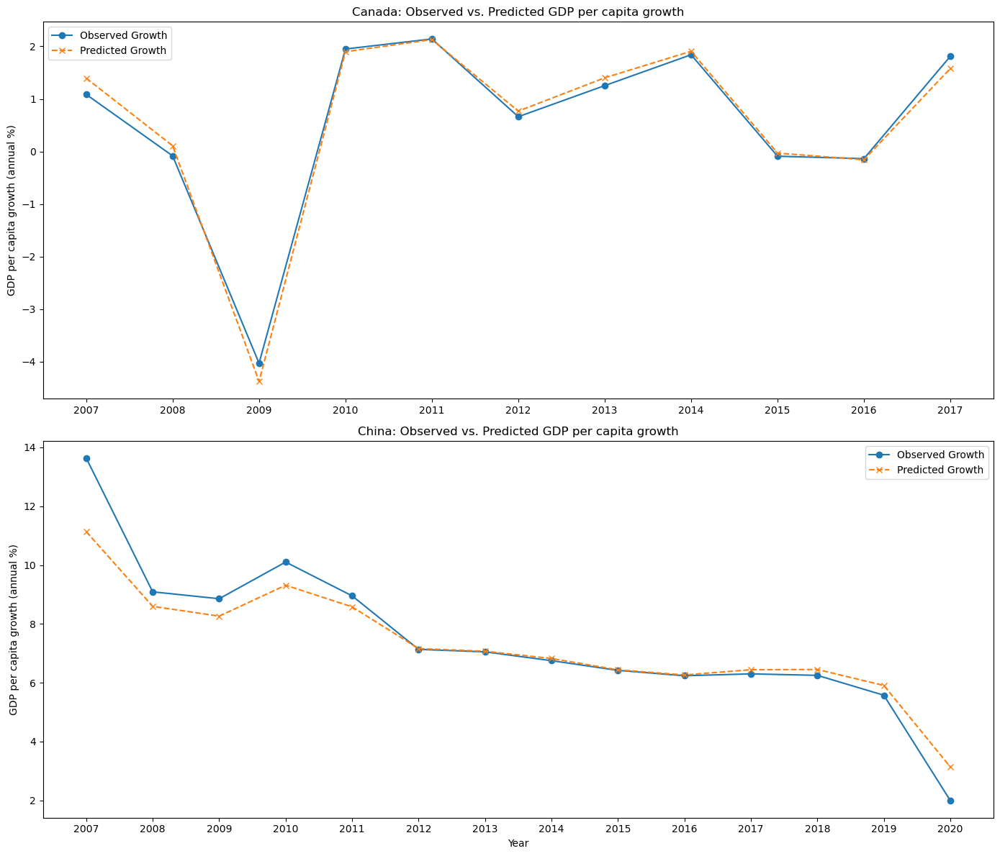

In [109]:
fig, ax = plt.subplots(2, 1, figsize=(14, 12))

# Canada plot
ax[0].plot(canada_data.index, canada_data['GDP per capita growth (annual %)'], label='Observed Growth', marker='o')
ax[0].plot(canada_data.index, canada_data['predicted_growth'], label='Predicted Growth', linestyle='--', marker='x')
ax[0].set_title('Canada: Observed vs. Predicted GDP per capita growth')
ax[0].set_ylabel('GDP per capita growth (annual %)')
ax[0].legend()

# China plot
ax[1].plot(china_data.index, china_data['GDP per capita growth (annual %)'], label='Observed Growth', marker='o')
ax[1].plot(china_data.index, china_data['predicted_growth'], label='Predicted Growth', linestyle='--', marker='x')
ax[1].set_title('China: Observed vs. Predicted GDP per capita growth')
ax[1].set_ylabel('GDP per capita growth (annual %)')
ax[1].set_xlabel('Year')
ax[1].legend()

plt.tight_layout()
plt.show()
